In [1]:
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.dates as mdates
import mplcursors
import numpy as np
import matplotlib.cm as cm
%matplotlib notebook
plt.ion()
from sklearn.cluster import KMeans
import seaborn as sns
import plotly.graph_objects as go
from plotly import tools
from plotly.subplots import make_subplots
import plotly.offline as py

# Configure display options
pd.set_option('display.max_rows', None)     # To display all rows
pd.set_option('display.max_columns', None)  # To display all columns

In [2]:
df = pd.read_csv('B737MAX-8-M-03.csv')
sim=df['Sensor Name'][0]

In [3]:
print(sim)

B737MAX-8-M-03


In [4]:
df.head()

,DataMessageGUID,SensorID,Sensor Name,Date,Value,Formatted Value,Battery,Raw Data,Sensor State,GatewayID,Alert Sent,Signal Strength,Voltage
0,e65704de-ba5f-4748-9a25-505f441c1d4c,683664,B737MAX-8-M-03,06/27/2023 10:25,7.4,"7.4 Ah | Phase 1: Min 17, Max 19, Avg 17.79, ...",100,17.79|19|17|100|14.87|16|14|100|11.68|13|11|10...,0,965435,False,58,3.31
1,ac4ab498-4859-4ca0-b1d7-abdc656e75d2,683664,B737MAX-8-M-03,06/27/2023 10:15,7.9,"7.9 Ah | Phase 1: Min 18, Max 19, Avg 18.7, D...",100,18.7|19|18|100|15.73|16|15|100|12.8|13|12|100|...,0,965435,False,58,3.31
2,e39fc212-b8bb-4721-8186-c36c1496b376,683664,B737MAX-8-M-03,06/27/2023 10:05,7.8,"7.8 Ah | Phase 1: Min 18, Max 18, Avg 18.62, ...",100,18.62|18|18|100|15.59|15|15|100|12.71|13|12|10...,0,965435,False,43,3.31
3,13918862-80e2-41b8-8b9b-3972639f8547,683664,B737MAX-8-M-03,06/27/2023 09:55,7.8,"7.8 Ah | Phase 1: Min 17, Max 20, Avg 18.54, ...",100,18.54|20|17|100|15.4|16|14|100|12.54|14|11|100...,0,965435,False,31,3.31
4,7e2afd13-5aa5-4b4d-817d-db75e66d81ed,683664,B737MAX-8-M-03,06/27/2023 09:45,7.2,"7.2 Ah | Phase 1: Min 16, Max 17, Avg 17.34, ...",100,17.34|17|16|100|14.36|14|13|100|11.51|11|11|10...,0,965435,False,63,3.31


In [5]:
df.shape

(4495, 13)

In [6]:
#df.drop([:-4], axis=0, inplace=True)

if sim=='B737MAX-8-M-03':
    df=df[:-4]
else:
    df=df

In [7]:
df.shape

(4491, 13)

In [8]:
df.tail(10)

,DataMessageGUID,SensorID,Sensor Name,Date,Value,Formatted Value,Battery,Raw Data,Sensor State,GatewayID,Alert Sent,Signal Strength,Voltage
4481,ca3ad3a8-87cf-4b16-b820-1d2f45a6c479,683664,B737MAX-8-M-03,05/23/2023 17:42,7.5,"7.5 Ah | Phase 1: Min 17, Max 20, Avg 17.92, ...",100,17.92|20|17|100|15.15|17|14|100|12.13|14|11|10...,0,965435,False,46,3.34
4482,4526f2c7-cb15-4a57-ae1c-e81a558a7c37,683664,B737MAX-8-M-03,05/23/2023 17:32,7.7,"7.7 Ah | Phase 1: Min 17, Max 20, Avg 18.2, D...",100,18.2|20|17|100|15.4|18|14|100|12.44|15|11|100|...,0,965435,False,48,3.34
4483,1ddda92a-e405-4fd2-8fe4-da7fe6cdc813,683664,B737MAX-8-M-03,05/23/2023 17:22,7.7,"7.7 Ah | Phase 1: Min 17, Max 19, Avg 18.15, ...",100,18.15|19|17|100|15.39|16|14|100|12.41|13|11|10...,0,965435,False,41,3.34
4484,455f273a-bafc-4b76-9655-22c4d22e46ac,683664,B737MAX-8-M-03,05/23/2023 17:12,7.6,"7.6 Ah | Phase 1: Min 17, Max 30, Avg 18.11, ...",100,18.11|30|17|100|15.35|27|14|100|12.34|24|11|10...,0,965435,False,34,3.34
4485,095b63d9-3eb6-43ef-8729-38d30518daf4,683664,B737MAX-8-M-03,05/23/2023 17:02,7.0,"7.0 Ah | Phase 1: Min 16, Max 19, Avg 16.82, ...",100,16.82|19|16|100|14.18|16|13|100|11.13|13|10|10...,0,965435,False,38,3.34
4486,687d51e3-adaf-46b8-98d3-1df8da3455b9,683664,B737MAX-8-M-03,05/23/2023 16:52,6.9,"6.9 Ah | Phase 1: Min 16, Max 16, Avg 16.63, ...",100,16.63|16|16|100|13.99|14|13|100|10.95|11|10|10...,0,965435,False,38,3.35
4487,5cb92903-d9d5-4a36-847c-274bce4e63fc,683664,B737MAX-8-M-03,05/23/2023 16:42,7.3,"7.3 Ah | Phase 1: Min 15, Max 22, Avg 17.31, ...",100,17.31|22|15|100|14.58|19|12|100|11.67|16|10|10...,0,965435,False,41,3.34
4488,c6b658c2-d685-4e94-8b17-cfe10feae0fc,683664,B737MAX-8-M-03,05/23/2023 16:32,7.6,"7.6 Ah | Phase 1: Min 17, Max 20, Avg 18.07, ...",100,18.07|20|17|100|15.33|17|14|100|12.25|14|11|10...,0,965435,False,62,3.36
4489,8029a2bb-8a1b-49e7-8568-b1ff370e79ae,683664,B737MAX-8-M-03,05/23/2023 16:22,0.0,"0.0 Ah | Phase 1: Min 17, Max 17, Avg 17.73, ...",100,17.73|17|17|100|15.27|15|15|100|11.98|11|11|10...,0,965435,False,55,3.36
4490,d44ce830-2bf3-49d2-8723-c0fac38be648,683664,B737MAX-8-M-03,05/23/2023 16:22,3.8,"3.8 Ah | Phase 1: Min 17, Max 19, Avg 17.95, ...",100,17.95|19|17|100|15.2|16|14|100|12.15|13|11|100...,0,965435,False,53,3.35


In [9]:
df.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4491 entries, 0 to 4490
Data columns (total 13 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   DataMessageGUID  4491 non-null   object 
 1   SensorID         4491 non-null   int64  
 2   Sensor Name      4491 non-null   object 
 3   Date             4491 non-null   object 
 4   Value            4491 non-null   float64
 5   Formatted Value  4491 non-null   object 
 6   Battery          4491 non-null   int64  
 7   Raw Data         4491 non-null   object 
 8   Sensor State     4491 non-null   int64  
 9   GatewayID        4491 non-null   int64  
 10  Alert Sent       4491 non-null   bool   
 11  Signal Strength  4491 non-null   int64  
 12  Voltage          4491 non-null   float64
dtypes: bool(1), float64(2), int64(5), object(5)
memory usage: 425.5+ KB


In [10]:
#new columns names based 'Raw Data' order
col_name=['phase1_avg','phase1_max','phase1_min','phase1_duty','phase2_avg','phase2_max','phase2_min','phase2_duty','phase3_avg','phase3_max','phase3_min','phase3_duty','value_Ah','sensor_state']

#split and convert it into list
split_values = df['Raw Data'].str.split('|').tolist()

# Create new columns in the DataFrame
for i, col_values in enumerate(zip(*split_values)):
    df[col_name[i]] = [float(val) for val in col_values]

    
df = df.rename(columns={'Date': 'Timestamp' }) 
df[['Date', 'Time']] = df['Timestamp'].str.split(' ', 1, expand=True)    
df['Timestamp'] = pd.to_datetime(df['Timestamp'])
df['Date'] = pd.to_datetime(df['Date'])
# Extract the number of seconds since midnight from the 'Time' column
df['Time'] = pd.to_datetime(df['Time']).dt.hour * 3600 + \
             pd.to_datetime(df['Time']).dt.minute * 60 #+ \
             #pd.to_datetime(df['Time']).dt.second
    
# Display the updated DataFrame
df.head()

,DataMessageGUID,SensorID,Sensor Name,Timestamp,Value,Formatted Value,Battery,Raw Data,Sensor State,GatewayID,Alert Sent,Signal Strength,Voltage,phase1_avg,phase1_max,phase1_min,phase1_duty,phase2_avg,phase2_max,phase2_min,phase2_duty,phase3_avg,phase3_max,phase3_min,phase3_duty,value_Ah,sensor_state,Date,Time
0,e65704de-ba5f-4748-9a25-505f441c1d4c,683664,B737MAX-8-M-03,2023-06-27 10:25:00,7.4,"7.4 Ah | Phase 1: Min 17, Max 19, Avg 17.79, ...",100,17.79|19|17|100|14.87|16|14|100|11.68|13|11|10...,0,965435,False,58,3.31,17.79,19.0,17.0,100.0,14.87,16.0,14.0,100.0,11.68,13.0,11.0,100.0,7.4,0.0,2023-06-27,37500
1,ac4ab498-4859-4ca0-b1d7-abdc656e75d2,683664,B737MAX-8-M-03,2023-06-27 10:15:00,7.9,"7.9 Ah | Phase 1: Min 18, Max 19, Avg 18.7, D...",100,18.7|19|18|100|15.73|16|15|100|12.8|13|12|100|...,0,965435,False,58,3.31,18.70,19.0,18.0,100.0,15.73,16.0,15.0,100.0,12.80,13.0,12.0,100.0,7.9,0.0,2023-06-27,36900
2,e39fc212-b8bb-4721-8186-c36c1496b376,683664,B737MAX-8-M-03,2023-06-27 10:05:00,7.8,"7.8 Ah | Phase 1: Min 18, Max 18, Avg 18.62, ...",100,18.62|18|18|100|15.59|15|15|100|12.71|13|12|10...,0,965435,False,43,3.31,18.62,18.0,18.0,100.0,15.59,15.0,15.0,100.0,12.71,13.0,12.0,100.0,7.8,0.0,2023-06-27,36300
3,13918862-80e2-41b8-8b9b-3972639f8547,683664,B737MAX-8-M-03,2023-06-27 09:55:00,7.8,"7.8 Ah | Phase 1: Min 17, Max 20, Avg 18.54, ...",100,18.54|20|17|100|15.4|16|14|100|12.54|14|11|100...,0,965435,False,31,3.31,18.54,20.0,17.0,100.0,15.40,16.0,14.0,100.0,12.54,14.0,11.0,100.0,7.8,0.0,2023-06-27,35700
4,7e2afd13-5aa5-4b4d-817d-db75e66d81ed,683664,B737MAX-8-M-03,2023-06-27 09:45:00,7.2,"7.2 Ah | Phase 1: Min 16, Max 17, Avg 17.34, ...",100,17.34|17|16|100|14.36|14|13|100|11.51|11|11|10...,0,965435,False,63,3.31,17.34,17.0,16.0,100.0,14.36,14.0,13.0,100.0,11.51,11.0,11.0,100.0,7.2,0.0,2023-06-27,35100


In [11]:
df.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4491 entries, 0 to 4490
Data columns (total 29 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   DataMessageGUID  4491 non-null   object        
 1   SensorID         4491 non-null   int64         
 2   Sensor Name      4491 non-null   object        
 3   Timestamp        4491 non-null   datetime64[ns]
 4   Value            4491 non-null   float64       
 5   Formatted Value  4491 non-null   object        
 6   Battery          4491 non-null   int64         
 7   Raw Data         4491 non-null   object        
 8   Sensor State     4491 non-null   int64         
 9   GatewayID        4491 non-null   int64         
 10  Alert Sent       4491 non-null   bool          
 11  Signal Strength  4491 non-null   int64         
 12  Voltage          4491 non-null   float64       
 13  phase1_avg       4491 non-null   float64       
 14  phase1_max       4491 non-null   float64

<IPython.core.display.Javascript object>


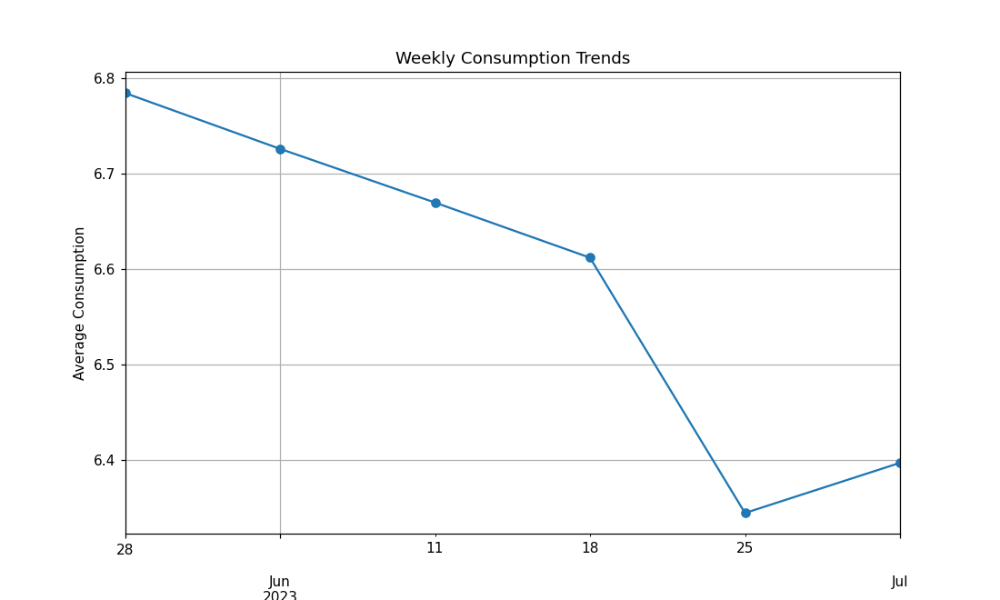

In [12]:
df.set_index('Timestamp', inplace=True)
weekly_consumption = df['Value'].resample('W').mean()

# Plot the weekly consumption trends
plt.figure(figsize=(10, 6))
weekly_consumption.plot(marker='o')
plt.xlabel('Week')
plt.ylabel('Average Consumption')
plt.title('Weekly Consumption Trends')
image_name = f"{sim}_weekly Current Consumption.png"
plt.savefig (image_name)
plt.grid(True)
plt.show()

<IPython.core.display.Javascript object>


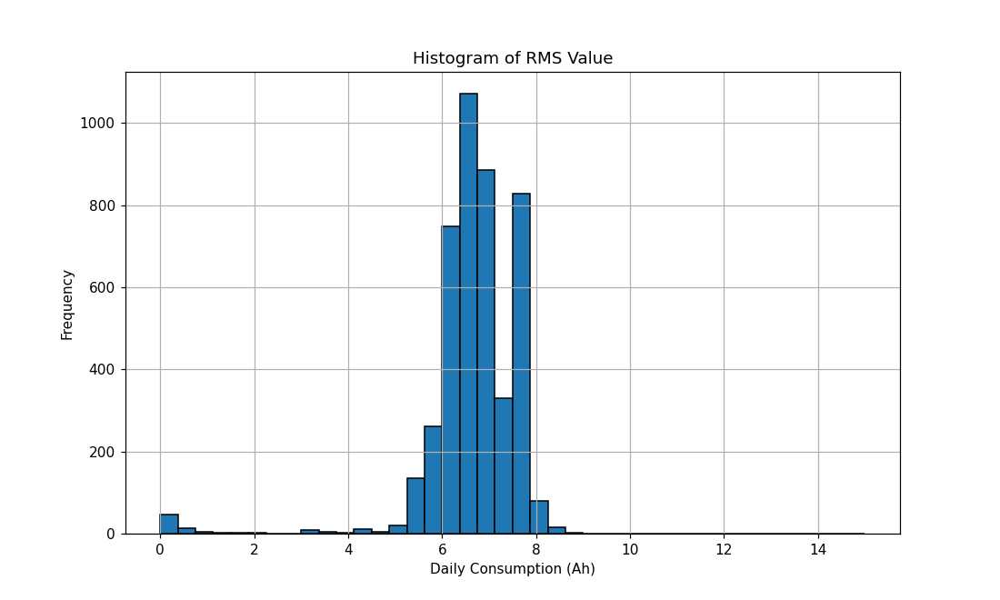

In [13]:
# Calculate daily consumption
daily_consumption = df['Value']

# Create the histogram
plt.figure(figsize=(10, 6))
plt.hist(daily_consumption, bins=40,range=(0, 15), edgecolor='black')
plt.xlabel('Daily Consumption (Ah)')
plt.ylabel('Frequency')
plt.title('Histogram of RMS Value')
image_name = f"{sim}_Histogram of RMS Value.png"
plt.savefig (image_name)
plt.grid(True)
plt.show()

<IPython.core.display.Javascript object>


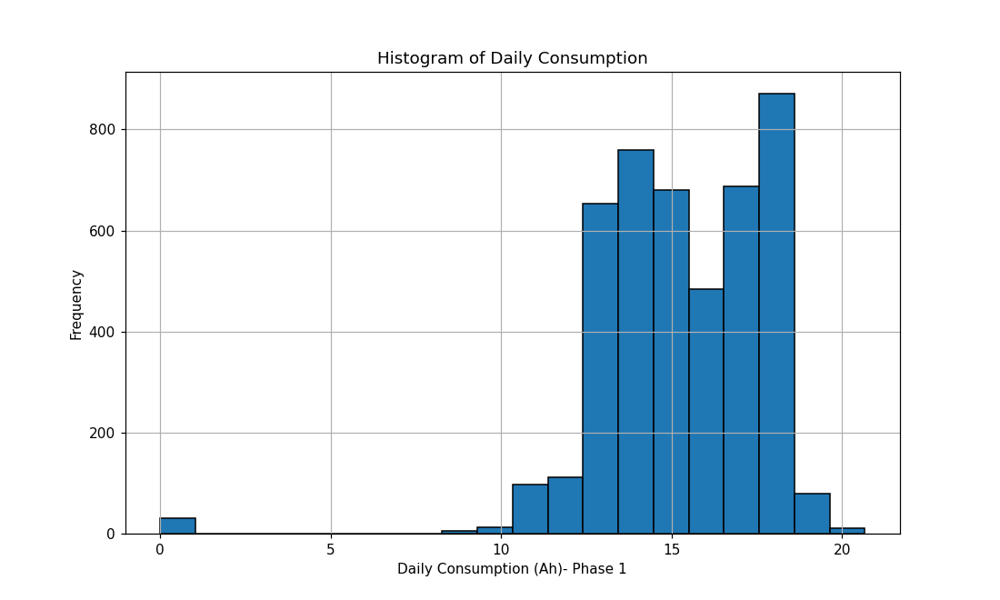

In [14]:
# Calculate daily consumption
daily_consumption = df['phase1_avg']

# Create the histogram
plt.figure(figsize=(10, 6), dpi=100)
plt.hist(daily_consumption, bins=20, edgecolor='black')
#plt.xticks(range(0,250, 10))
plt.xlabel('Daily Consumption (Ah)- Phase 1')
plt.ylabel('Frequency')
plt.title('Histogram of Daily Consumption')
plt.grid(True)
image_name = f"{sim}_Histogram of Daily Consumption.png"
plt.savefig (image_name)
plt.show()

<IPython.core.display.Javascript object>


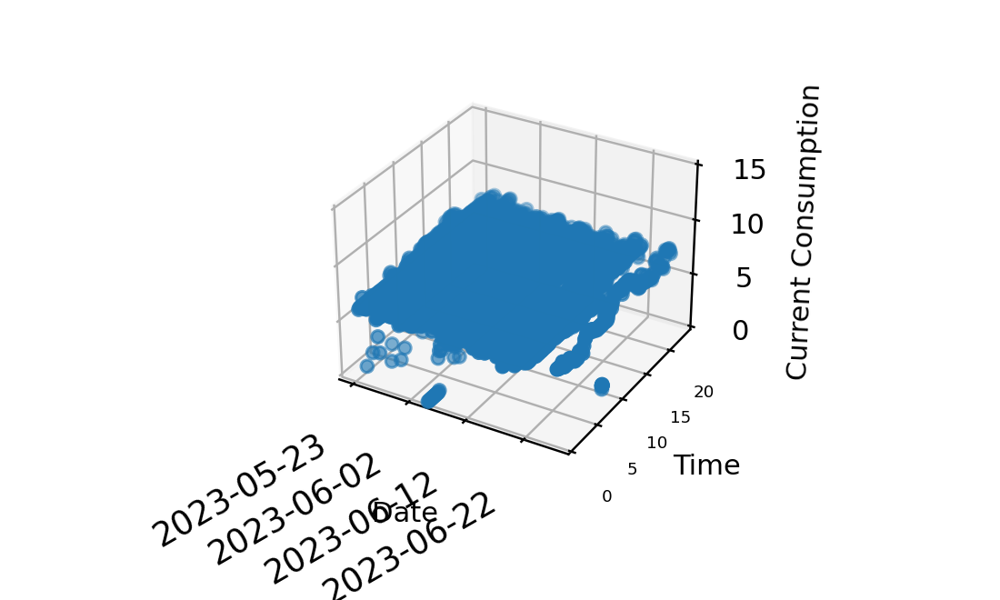

In [15]:
# Create a 3D plot
fig = plt.figure(figsize=(5, 3), dpi=200)
ax = fig.add_subplot(111, projection='3d')


ax.set_xlabel('Date')
ax.set_ylabel('Time')
ax.set_zlabel('Current Consumption')
x = mdates.date2num(df['Date'])
ax.set_zlim(0, 15)
ax.set_ylim(0, 24)  # Change the range to 0-24 hours
# Plot the 3D scatter plot
ax.scatter(x, df['Time']/3600, df['Value'])

# Format the 'Date' axis with date labels
date_formatter = mdates.DateFormatter('%Y-%m-%d')
ax.xaxis.set_major_formatter(date_formatter)
fig.autofmt_xdate()
ax.tick_params(axis='x', labelsize=12)
ax.tick_params(axis='y', labelsize=6)
ax.tick_params(axis='z', labelsize=10)
image_name = f"{sim}_current consumption.png"
plt.savefig (image_name)
# Show the plot
plt.show()

<IPython.core.display.Javascript object>


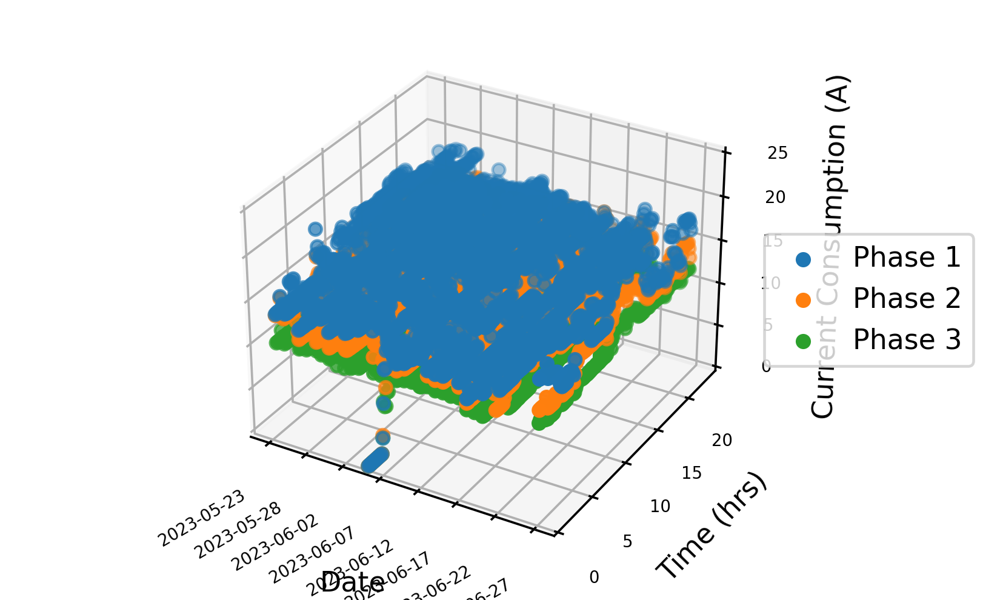

In [16]:
# Create a 3D plot
fig = plt.figure(figsize=(5, 3), dpi=300)
ax = fig.add_subplot(111, projection='3d')


ax.set_xlabel('Date')
ax.set_ylabel('Time (hrs)')
ax.set_zlabel('Current Consumption (A)')
x = mdates.date2num(df['Date'])
ax.set_zlim(0, 25)
ax.set_ylim(0, 24)  # Change the range to 0-24 hours
# Plot the 3D scatter plot
#ax.scatter(x, df['Time']/3600, df['phase1_avg'])
phase1=ax.scatter(x, df['Time']/3600, df['phase1_avg'], label='Phase 1')
phase2=ax.scatter(x, df['Time']/3600, df['phase2_avg'], label='Phase 2')
phase3=ax.scatter(x, df['Time']/3600, df['phase3_avg'], label='Phase 3')

# Format the 'Date' axis with date labels
date_formatter = mdates.DateFormatter('%Y-%m-%d')
ax.xaxis.set_major_formatter(date_formatter)
fig.autofmt_xdate()
ax.tick_params(axis='x', labelsize=6)
ax.tick_params(axis='y', labelsize=6)
ax.tick_params(axis='z', labelsize=6)
ax.legend(handles=[phase1, phase2, phase3])

ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.tight_layout()
image_name = f"{sim}_3D plot of total Current Consumption.png"
plt.savefig (image_name)
# Show the plot
plt.show()

<IPython.core.display.Javascript object>


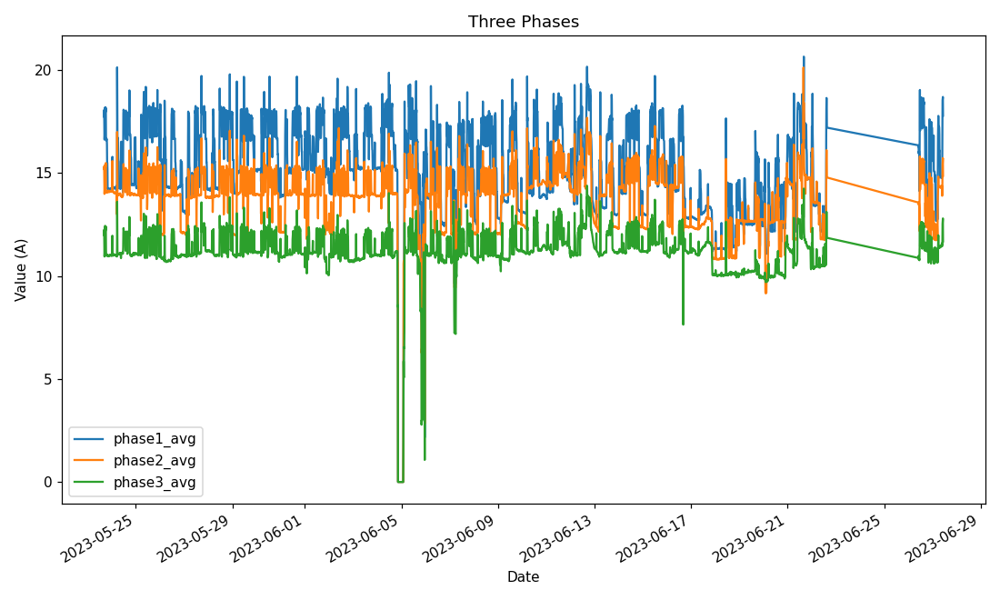

In [17]:
df.plot(y=['phase1_avg', 'phase2_avg', 'phase3_avg'], figsize=(10, 6))

# Set the title and labels
plt.title('Three Phases')
plt.xlabel('Date')
plt.ylabel('Value (A)')

plt.tight_layout()

#plt.savefig('Three Phases.png', dpi=800)
image_name = f"{sim}_Three phase plot.png"
plt.savefig (image_name)
# Display the chart
plt.show()

In [18]:
df['phase1-2']= df['phase1_avg']-df['phase2_avg']
df['phase2-3']= df['phase2_avg']-df['phase3_avg']
df['phase1-3']= df['phase1_avg']-df['phase3_avg']

<IPython.core.display.Javascript object>


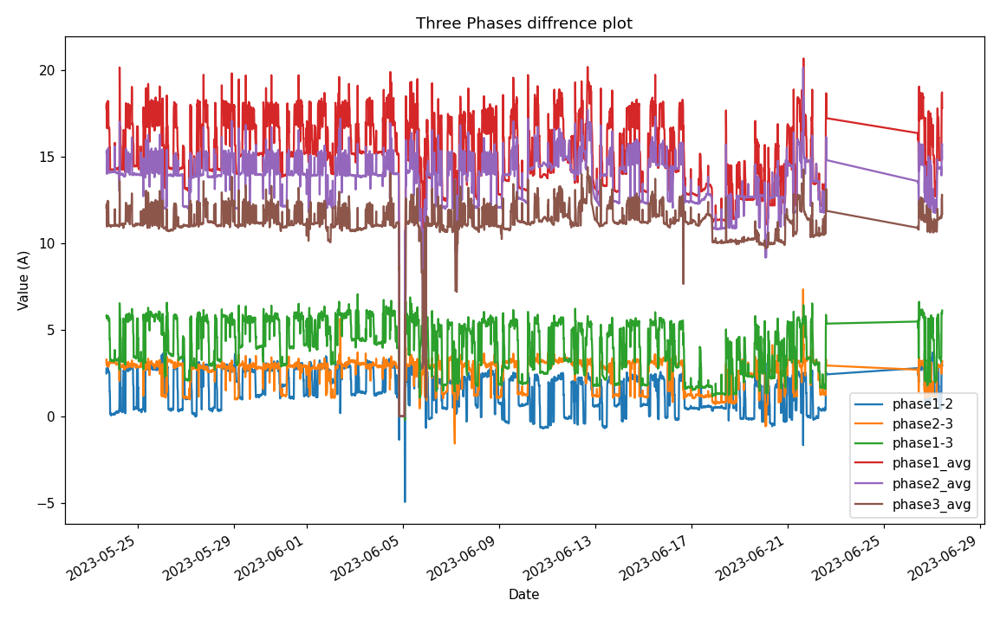

In [63]:
df.plot(y=['phase1-2', 'phase2-3', 'phase1-3', 'phase1_avg', 'phase2_avg', 'phase3_avg'], figsize=(10, 6))

# Set the title and labels
plt.title('Three Phases diffrence plot')
plt.xlabel('Date')
plt.ylabel('Value (A)')

plt.tight_layout()

#plt.savefig('Three Phases.png', dpi=800)
image_name = f"{sim}_Three phase difference plot.png"
plt.savefig (image_name)
# Display the chart
plt.show()

<IPython.core.display.Javascript object>


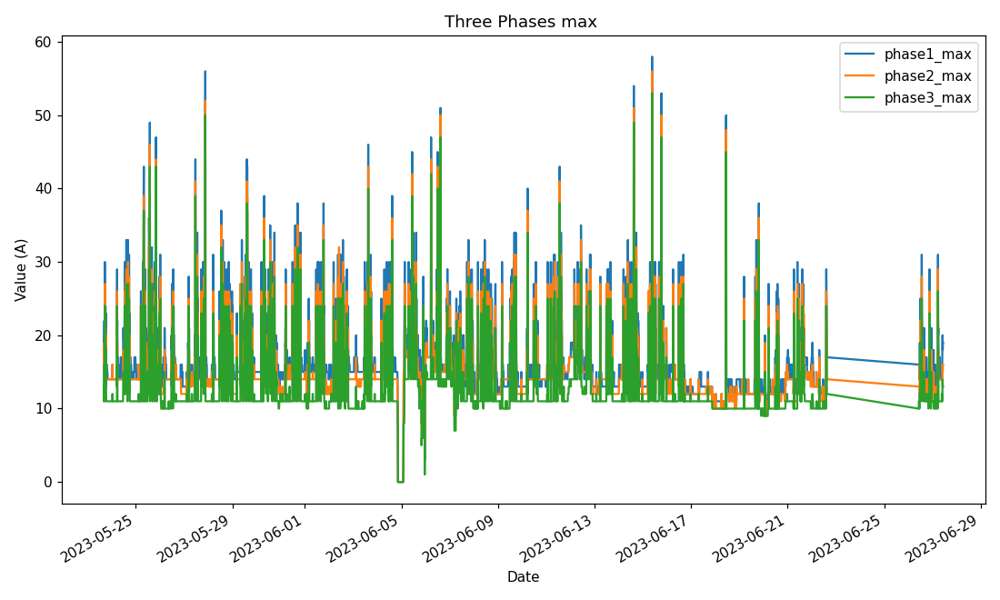

In [20]:
df.plot(y=['phase1_max', 'phase2_max', 'phase3_max'], figsize=(10, 6))

# Set the title and labels
plt.title('Three Phases max ')
plt.xlabel('Date')
plt.ylabel('Value (A)')

plt.tight_layout()

#plt.savefig('Three Phases max.png', dpi=800)
image_name = f"{sim}_Three phases max.png"
plt.savefig (image_name)
# Display the chart
plt.show()

<IPython.core.display.Javascript object>


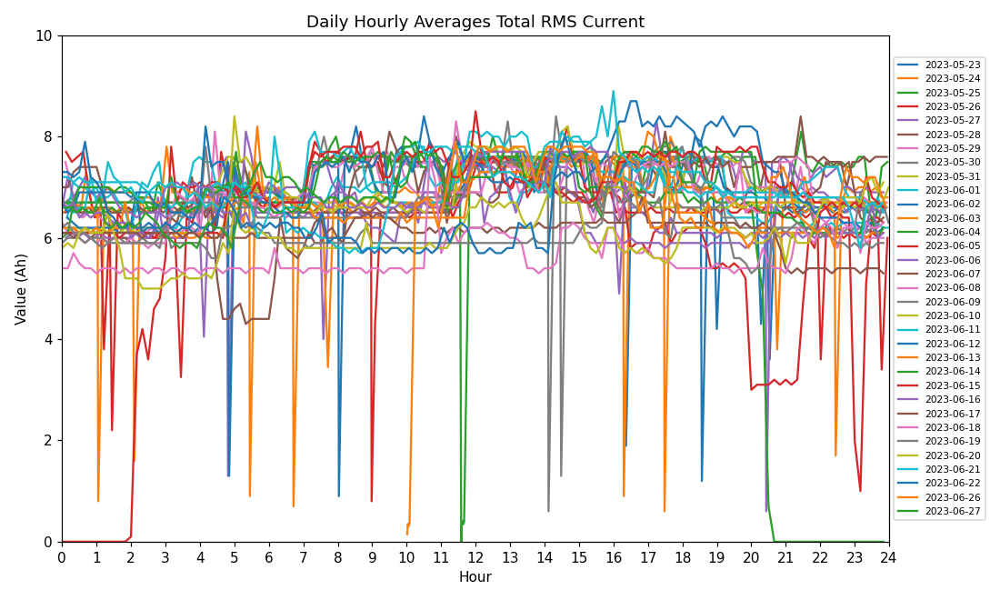

In [84]:


# Calculate daily hourly averages
df_avg = df.groupby([df.index.date, df['Time'] / 3600])['Value'].mean().reset_index()
df_avg.columns = ['Date', 'Hour', 'Average']

# Plot the daily hourly averages
fig, ax = plt.subplots(figsize=(10, 6))

# Iterate over the unique dates and plot the hourly averages
lines = []
for date in df_avg['Date'].unique():
    data = df_avg[df_avg['Date'] == date]
    line, = ax.plot(data['Hour'], data['Average'], label=str(date))
    lines.append(line)

# Create hover events for each line using mplcursors
mplcursors.cursor(lines).connect("add", lambda sel: sel.annotation.set_text(sel.artist.get_label()))

# Set the labels and title
ax.set_xlabel('Hour')
ax.set_ylabel('Value (Ah)')
ax.set_title('Daily Hourly Averages Total RMS Current')
ax.set_xticks(range(25))

# Add a legend
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5), fontsize=7)

# Set the same limits for both x and y axes
ax.set_xlim(0, 24)
ax.set_ylim(0, 10)  # Adjust the limits based on your data

plt.tight_layout()
image_name = f"{sim}_Daily Hourly Average Total RMS Current.png"
plt.savefig (image_name)
# Show the plot
plt.show()

<IPython.core.display.Javascript object>


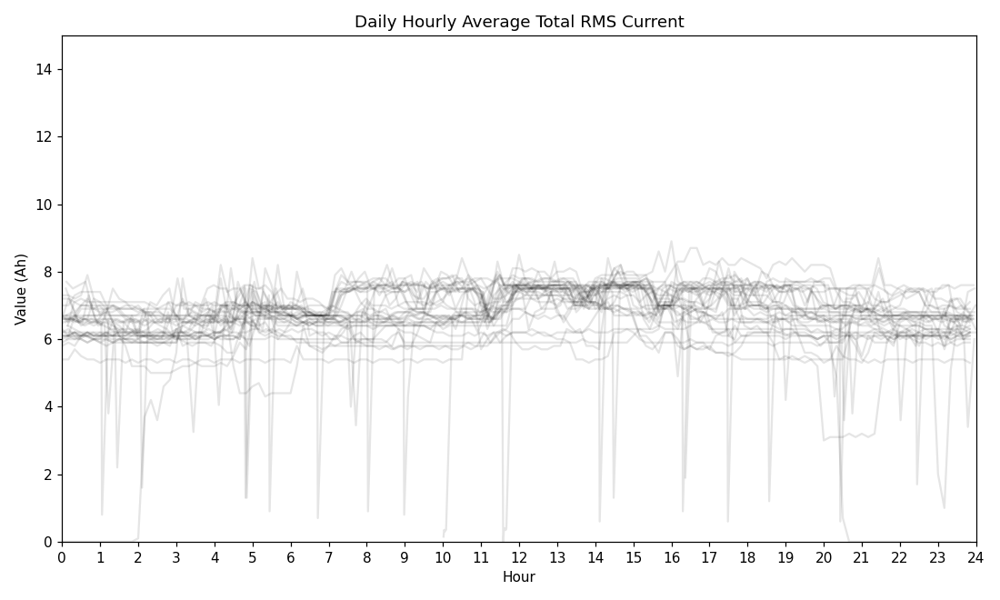

In [81]:
# Plot the daily hourly averages
fig, ax = plt.subplots(figsize=(10, 6))

# Iterate over the unique dates and plot the hourly averages
lines = []
for date in df_avg['Date'].unique():
    data = df_avg[df_avg['Date'] == date]
    line, = ax.plot(data['Hour'], data['Average'], label=str(date), color='black', alpha=0.10, linewidth=1.5)
    lines.append(line)

# Create hover events for each line using mplcursors
mplcursors.cursor(lines).connect("add", lambda sel: sel.annotation.set_text(sel.artist.get_label()))

# Set the labels and title
ax.set_xlabel('Hour')
ax.set_ylabel('Value (Ah)')
ax.set_title('Daily Hourly Average Total RMS Current')
ax.set_xticks(range(25))

# Add a legend
#ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))

# Set the same limits for both x and y axes
ax.set_xlim(0, 24)
ax.set_ylim(0, 15)  # Adjust the limits based on your data

plt.tight_layout()
image_name = f"{sim}_Daily Hourly Average Total RMS Current_reduced transparency.png"
plt.savefig (image_name)
# Show the plot
plt.show()

<IPython.core.display.Javascript object>


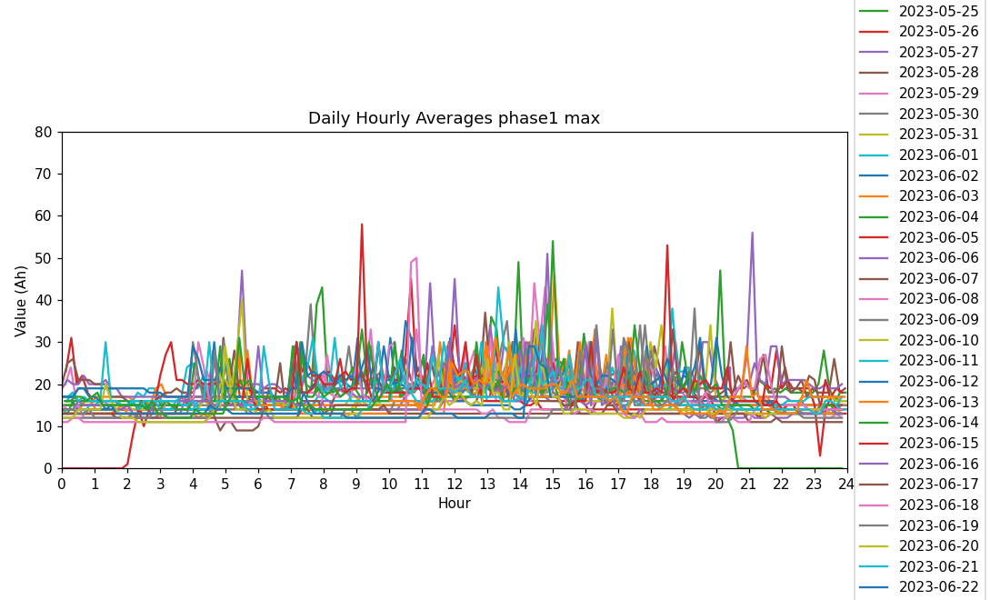

In [65]:

# Calculate daily hourly averages
df_avg = df.groupby([df.index.date, df['Time'] / 3600])['phase1_max'].mean().reset_index()
df_avg.columns = ['Date', 'Hour', 'Average']

# Plot the daily hourly averages
fig, ax = plt.subplots(figsize=(10, 6))

# Iterate over the unique dates and plot the hourly averages
lines = []
for date in df_avg['Date'].unique():
    data = df_avg[df_avg['Date'] == date]
    line, = ax.plot(data['Hour'], data['Average'], label=str(date))
    lines.append(line)

# Create hover events for each line using mplcursors
mplcursors.cursor(lines).connect("add", lambda sel: sel.annotation.set_text(sel.artist.get_label()))

# Set the labels and title
ax.set_xlabel('Hour')
ax.set_ylabel('Value (Ah)')
ax.set_title('Daily Hourly Averages phase1 max')
ax.set_xticks(range(25))

# Add a legend
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))

# Set the same limits for both x and y axes
ax.set_xlim(0, 24)
ax.set_ylim(0, 80)  # Adjust the limits based on your data

plt.tight_layout()
image_name = f"{sim}_Daily Hourly Averages phase1 max.png"
plt.savefig (image_name)
# Show the plot
plt.show()


<IPython.core.display.Javascript object>


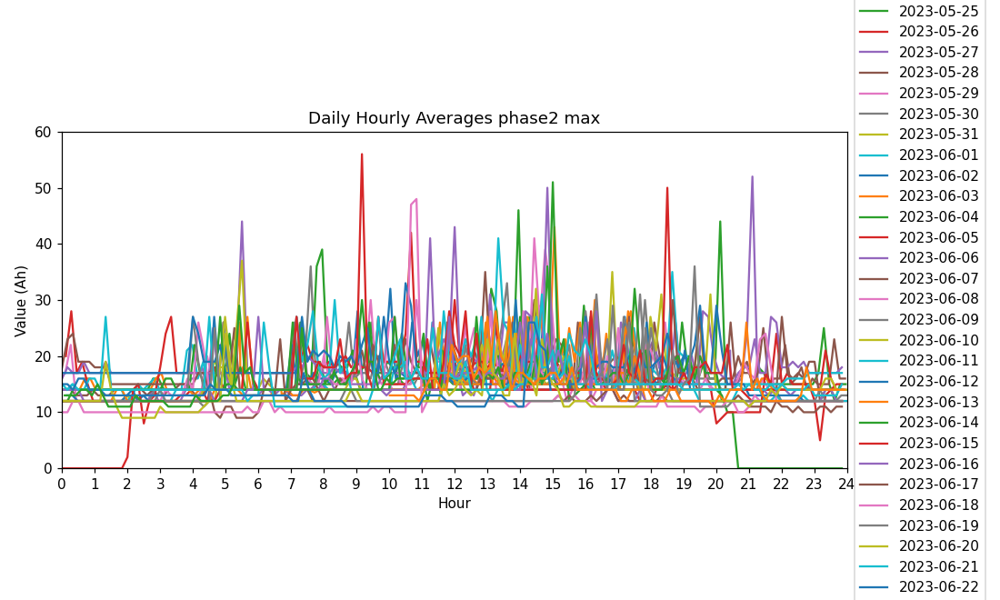

In [23]:


# Calculate daily hourly averages
df_avg = df.groupby([df.index.date, df['Time'] / 3600])['phase2_max'].mean().reset_index()
df_avg.columns = ['Date', 'Hour', 'Average']

# Plot the daily hourly averages
fig, ax = plt.subplots(figsize=(10, 6))

# Iterate over the unique dates and plot the hourly averages
lines = []
for date in df_avg['Date'].unique():
    data = df_avg[df_avg['Date'] == date]
    line, = ax.plot(data['Hour'], data['Average'], label=str(date))
    lines.append(line)

# Create hover events for each line using mplcursors
mplcursors.cursor(lines).connect("add", lambda sel: sel.annotation.set_text(sel.artist.get_label()))

# Set the labels and title
ax.set_xlabel('Hour')
ax.set_ylabel('Value (Ah)')
ax.set_title('Daily Hourly Averages phase2 max')
ax.set_xticks(range(25))

# Add a legend
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))

# Set the same limits for both x and y axes
ax.set_xlim(0, 24)
ax.set_ylim(0, 60)  # Adjust the limits based on your data

plt.tight_layout()
image_name = f"{sim}_Daily Hourly Average of Phase2 max.png"
plt.savefig (image_name)
# Show the plot
plt.show()

<IPython.core.display.Javascript object>


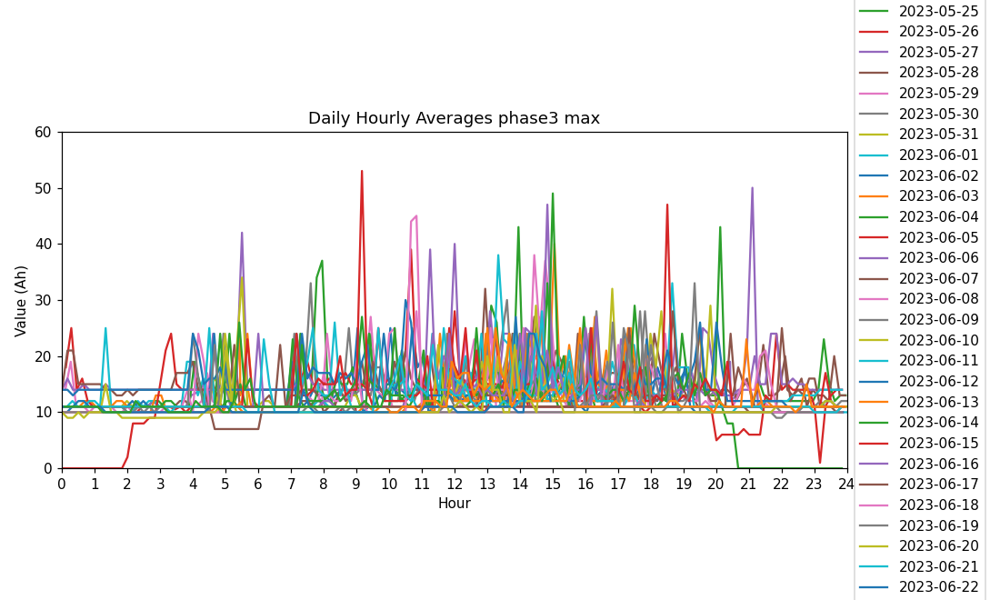

In [24]:
# Calculate daily hourly averages
df_avg = df.groupby([df.index.date, df['Time'] / 3600])['phase3_max'].mean().reset_index()
df_avg.columns = ['Date', 'Hour', 'Average']

# Plot the daily hourly averages
fig, ax = plt.subplots(figsize=(10, 6))

# Iterate over the unique dates and plot the hourly averages
lines = []
for date in df_avg['Date'].unique():
    data = df_avg[df_avg['Date'] == date]
    line, = ax.plot(data['Hour'], data['Average'], label=str(date))
    lines.append(line)

# Create hover events for each line using mplcursors
mplcursors.cursor(lines).connect("add", lambda sel: sel.annotation.set_text(sel.artist.get_label()))

# Set the labels and title
ax.set_xlabel('Hour')
ax.set_ylabel('Value (Ah)')
ax.set_title('Daily Hourly Averages phase3 max')
ax.set_xticks(range(25))

# Add a legend
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))

# Set the same limits for both x and y axes
ax.set_xlim(0, 24)
ax.set_ylim(0, 60)  # Adjust the limits based on your data

plt.tight_layout()
image_name = f"{sim}_Daily Hourly averages phase3 max.png"
plt.savefig (image_name)
# Show the plot
plt.show()

<IPython.core.display.Javascript object>


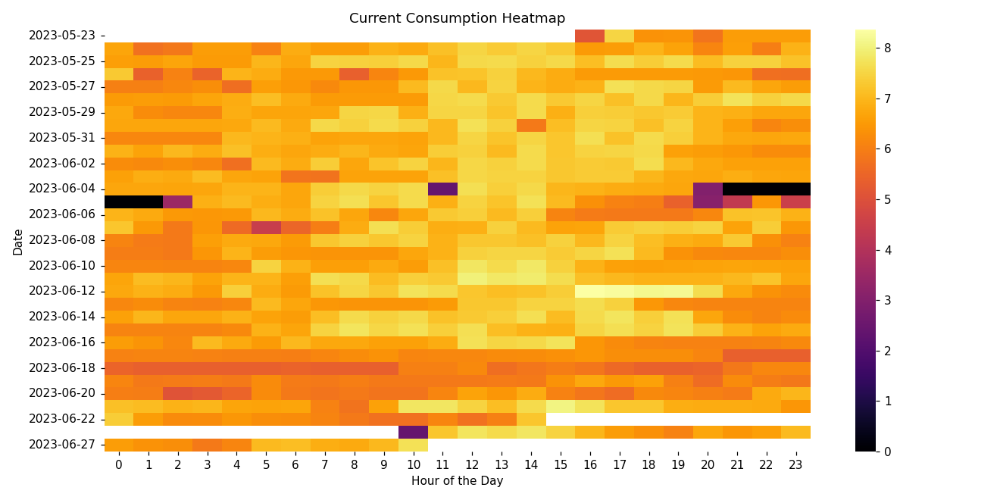

In [25]:
import seaborn as sns
df_hourly = df.resample('H').mean()
#plt.figure(figsize=(12, 6))  # Adjust the figure size as needed

df_pivot = df_hourly.pivot_table(index=df_hourly.index.date, columns=df_hourly.index.hour, values='Value')

# Create a heatmap using seaborn
plt.figure(figsize=(12, 6))  # Adjust the figure size as needed
sns.heatmap(df_pivot, cmap='inferno')

# Set labels and title
plt.xlabel('Hour of the Day')
plt.ylabel('Date')
plt.title('Current Consumption Heatmap')
plt.tight_layout()
image_name = f"{sim}_current consumption Heatmap.png"
plt.savefig (image_name)

# Display the heatmap
plt.show()

<IPython.core.display.Javascript object>


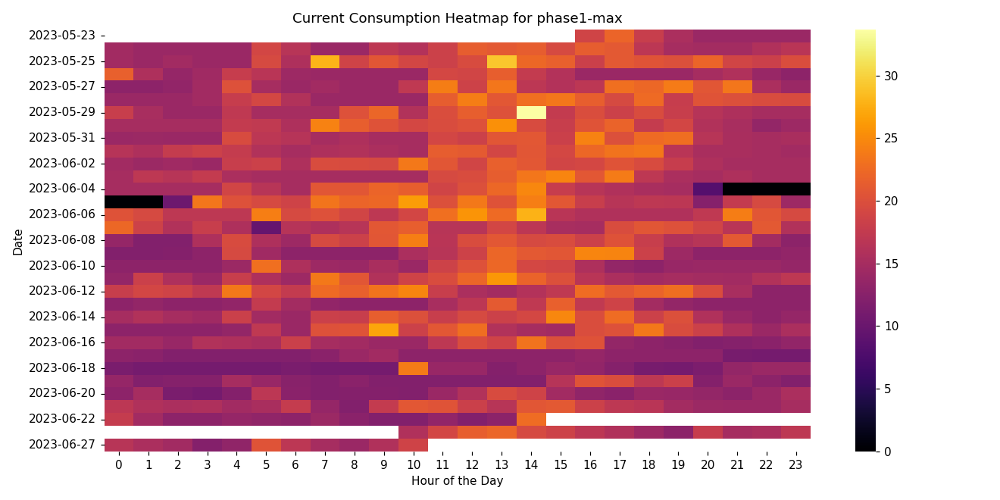

In [26]:
df_hourly = df.resample('H').mean()
#plt.figure(figsize=(12, 6))  # Adjust the figure size as needed

df_pivot = df_hourly.pivot_table(index=df_hourly.index.date, columns=df_hourly.index.hour, values='phase1_max')

# Create a heatmap using seaborn
plt.figure(figsize=(12, 6))  # Adjust the figure size as needed
sns.heatmap(df_pivot, cmap='inferno')

# Set labels and title
plt.xlabel('Hour of the Day')
plt.ylabel('Date')
plt.title('Current Consumption Heatmap for phase1-max')
plt.tight_layout()
image_name = f"{sim}_current consumption Heatmap for phase1.png"
plt.savefig (image_name)

# Display the heatmap
plt.show()

<IPython.core.display.Javascript object>


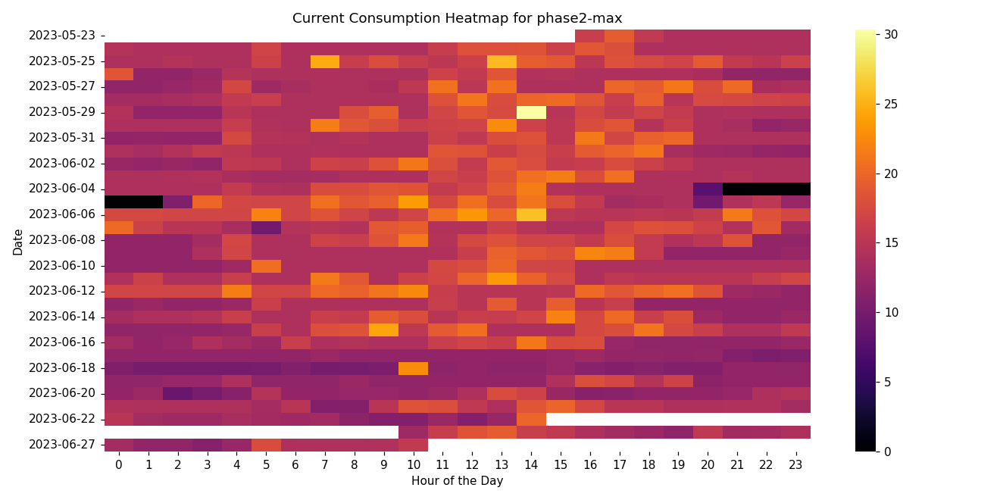

In [27]:
df_hourly = df.resample('H').mean()
#plt.figure(figsize=(12, 6))  # Adjust the figure size as needed

df_pivot = df_hourly.pivot_table(index=df_hourly.index.date, columns=df_hourly.index.hour, values='phase2_max')

# Create a heatmap using seaborn
plt.figure(figsize=(12, 6))  # Adjust the figure size as needed
sns.heatmap(df_pivot, cmap='inferno')

# Set labels and title
plt.xlabel('Hour of the Day')
plt.ylabel('Date')
plt.title('Current Consumption Heatmap for phase2-max')
plt.tight_layout()
image_name = f"{sim}_current consumption eatmap for phase2-max.png"
plt.savefig (image_name)

# Display the heatmap
plt.show()

<IPython.core.display.Javascript object>


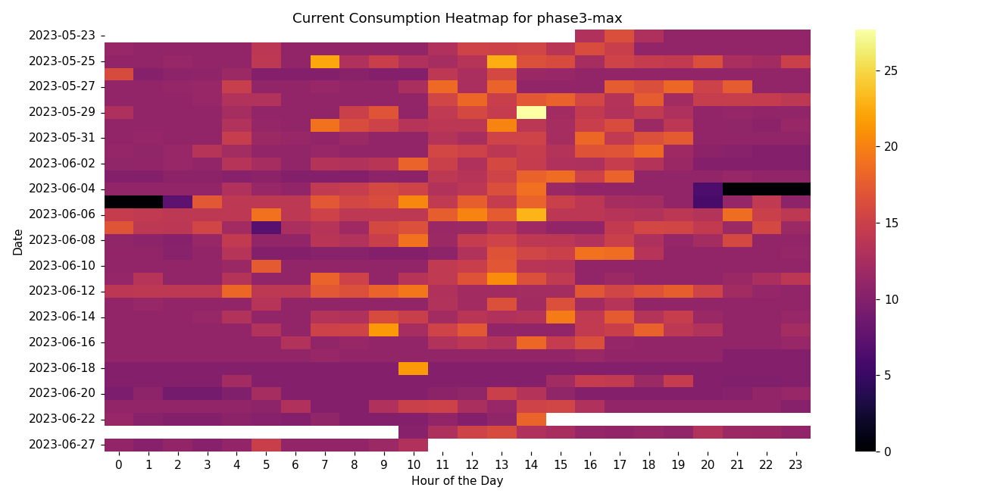

In [28]:
df_hourly = df.resample('H').mean()
#plt.figure(figsize=(12, 6))  # Adjust the figure size as needed

df_pivot = df_hourly.pivot_table(index=df_hourly.index.date, columns=df_hourly.index.hour, values='phase3_max')

# Create a heatmap using seaborn
plt.figure(figsize=(12, 6))  # Adjust the figure size as needed
sns.heatmap(df_pivot, cmap='inferno')

# Set labels and title
plt.xlabel('Hour of the Day')
plt.ylabel('Date')
plt.title('Current Consumption Heatmap for phase3-max')
plt.tight_layout()
image_name = f"{sim}_current consumption heatmap for phase3-max.png"
plt.savefig (image_name)

# Display the heatmap
plt.show()

<IPython.core.display.Javascript object>


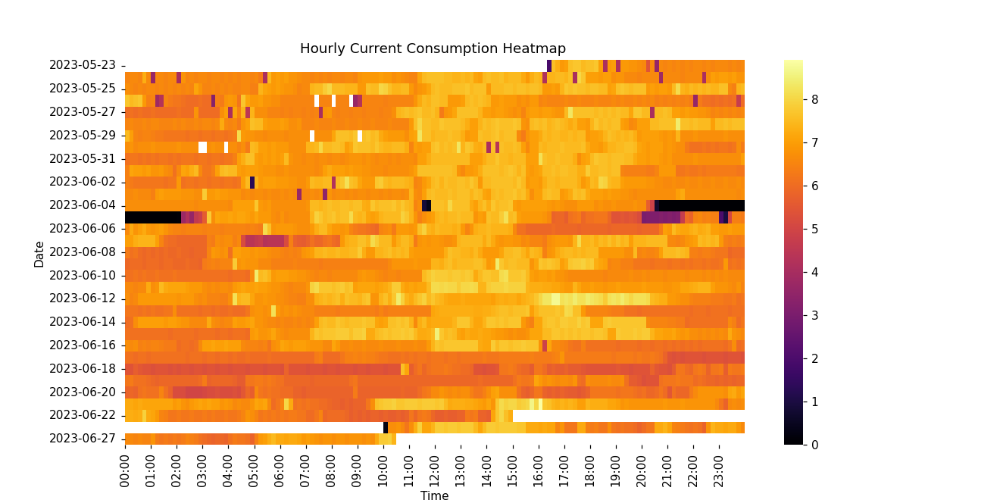

In [29]:
import datetime
df_10min = df.resample('10T').mean()

# Create a pivot table with dates as rows and time as columns
df_pivot = df_10min.pivot_table(index=df_10min.index.date, columns=df_10min.index.time, values='Value')

# Create a heatmap using seaborn
plt.figure(figsize=(12, 6))  # Adjust the figure size as needed
sns.heatmap(df_pivot, cmap='inferno')

# Adjust the x-axis tick labels
num_ticks = len(df_pivot.columns)
time_labels = [datetime.datetime.combine(datetime.date(1970, 1, 1), time) for time in df_pivot.columns]
plt.xticks(range(num_ticks)[::6], [time.strftime('%H:%M') for time in time_labels[::6]])

# Set labels and title
plt.xlabel('Time')
plt.ylabel('Date')
plt.title('Hourly Current Consumption Heatmap ')
image_name = f"{sim}_current consumption Heatmap hourly.png"
plt.savefig (image_name)
# Display the heatmap
plt.show()

<IPython.core.display.Javascript object>


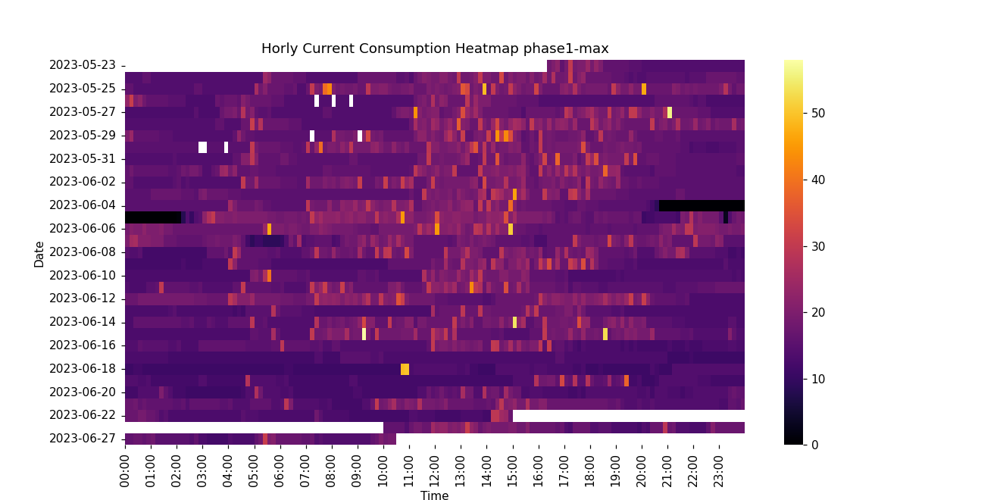

In [30]:
df_10min = df.resample('10T').mean()

# Create a pivot table with dates as rows and time as columns
df_pivot = df_10min.pivot_table(index=df_10min.index.date, columns=df_10min.index.time, values='phase1_max')

# Create a heatmap using seaborn
plt.figure(figsize=(12, 6))  # Adjust the figure size as needed
sns.heatmap(df_pivot, cmap='inferno')

# Adjust the x-axis tick labels
num_ticks = len(df_pivot.columns)
time_labels = [datetime.datetime.combine(datetime.date(1970, 1, 1), time) for time in df_pivot.columns]
plt.xticks(range(num_ticks)[::6], [time.strftime('%H:%M') for time in time_labels[::6]])

# Set labels and title
plt.xlabel('Time')
plt.ylabel('Date')
plt.title('Horly Current Consumption Heatmap phase1-max')
image_name = f"{sim}_current consumption Heatmap hourly phase1 max.png"
plt.savefig (image_name)
# Display the heatmap
plt.show()

<IPython.core.display.Javascript object>


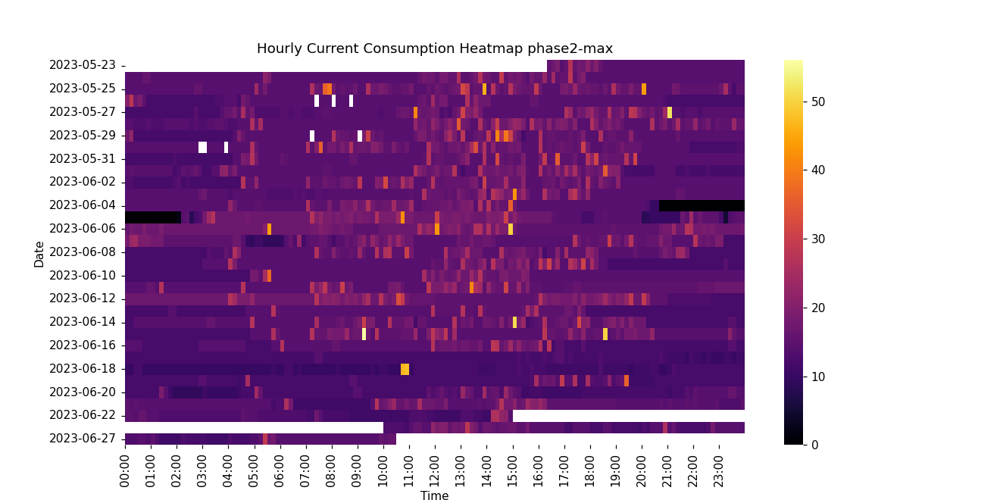

In [31]:
df_10min = df.resample('10T').mean()

# Create a pivot table with dates as rows and time as columns
df_pivot = df_10min.pivot_table(index=df_10min.index.date, columns=df_10min.index.time, values='phase2_max')

# Create a heatmap using seaborn
plt.figure(figsize=(12, 6))  # Adjust the figure size as needed
sns.heatmap(df_pivot, cmap='inferno')

# Adjust the x-axis tick labels
num_ticks = len(df_pivot.columns)
time_labels = [datetime.datetime.combine(datetime.date(1970, 1, 1), time) for time in df_pivot.columns]
plt.xticks(range(num_ticks)[::6], [time.strftime('%H:%M') for time in time_labels[::6]])

# Set labels and title
plt.xlabel('Time')
plt.ylabel('Date')
plt.title('Hourly Current Consumption Heatmap phase2-max')
image_name = f"{sim}_current consumption Heatmap hourly phase2 max.png"
plt.savefig (image_name)
# Display the heatmap
plt.show()

<IPython.core.display.Javascript object>


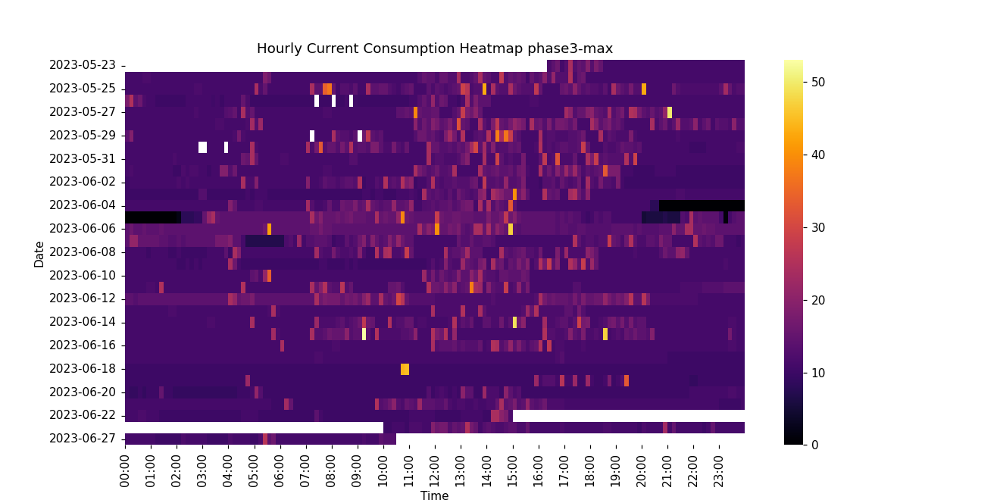

In [32]:
df_10min = df.resample('10T').mean()

# Create a pivot table with dates as rows and time as columns
df_pivot = df_10min.pivot_table(index=df_10min.index.date, columns=df_10min.index.time, values='phase3_max')

# Create a heatmap using seaborn
plt.figure(figsize=(12, 6))  # Adjust the figure size as needed
sns.heatmap(df_pivot, cmap='inferno')

# Adjust the x-axis tick labels
num_ticks = len(df_pivot.columns)
time_labels = [datetime.datetime.combine(datetime.date(1970, 1, 1), time) for time in df_pivot.columns]
plt.xticks(range(num_ticks)[::6], [time.strftime('%H:%M') for time in time_labels[::6]])

# Set labels and title
plt.xlabel('Time')
plt.ylabel('Date')
plt.title('Hourly Current Consumption Heatmap phase3-max')
image_name = f"{sim}_current consumption Heatmap hourly phase3-max.png"
plt.savefig (image_name)
# Display the heatmap
plt.show()

In [33]:
# Calculate the number of days since the earliest date
df['Day'] = (df['Date'] - df['Date'].min()).dt.days
df.tail(10)

,DataMessageGUID,SensorID,Sensor Name,Value,Formatted Value,Battery,Raw Data,Sensor State,GatewayID,Alert Sent,Signal Strength,Voltage,phase1_avg,phase1_max,phase1_min,phase1_duty,phase2_avg,phase2_max,phase2_min,phase2_duty,phase3_avg,phase3_max,phase3_min,phase3_duty,value_Ah,sensor_state,Date,Time,phase1-2,phase2-3,phase1-3,Day
Timestamp,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2023-05-23 17:42:00,ca3ad3a8-87cf-4b16-b820-1d2f45a6c479,683664,B737MAX-8-M-03,7.5,"7.5 Ah | Phase 1: Min 17, Max 20, Avg 17.92, ...",100,17.92|20|17|100|15.15|17|14|100|12.13|14|11|10...,0,965435,False,46,3.34,17.92,20.0,17.0,100.0,15.15,17.0,14.0,100.0,12.13,14.0,11.0,100.0,7.5,0.0,2023-05-23,63720,2.77,3.02,5.79,0
2023-05-23 17:32:00,4526f2c7-cb15-4a57-ae1c-e81a558a7c37,683664,B737MAX-8-M-03,7.7,"7.7 Ah | Phase 1: Min 17, Max 20, Avg 18.2, D...",100,18.2|20|17|100|15.4|18|14|100|12.44|15|11|100|...,0,965435,False,48,3.34,18.20,20.0,17.0,100.0,15.40,18.0,14.0,100.0,12.44,15.0,11.0,100.0,7.7,0.0,2023-05-23,63120,2.80,2.96,5.76,0
2023-05-23 17:22:00,1ddda92a-e405-4fd2-8fe4-da7fe6cdc813,683664,B737MAX-8-M-03,7.7,"7.7 Ah | Phase 1: Min 17, Max 19, Avg 18.15, ...",100,18.15|19|17|100|15.39|16|14|100|12.41|13|11|10...,0,965435,False,41,3.34,18.15,19.0,17.0,100.0,15.39,16.0,14.0,100.0,12.41,13.0,11.0,100.0,7.7,0.0,2023-05-23,62520,2.76,2.98,5.74,0
2023-05-23 17:12:00,455f273a-bafc-4b76-9655-22c4d22e46ac,683664,B737MAX-8-M-03,7.6,"7.6 Ah | Phase 1: Min 17, Max 30, Avg 18.11, ...",100,18.11|30|17|100|15.35|27|14|100|12.34|24|11|10...,0,965435,False,34,3.34,18.11,30.0,17.0,100.0,15.35,27.0,14.0,100.0,12.34,24.0,11.0,100.0,7.6,0.0,2023-05-23,61920,2.76,3.01,5.77,0
2023-05-23 17:02:00,095b63d9-3eb6-43ef-8729-38d30518daf4,683664,B737MAX-8-M-03,7.0,"7.0 Ah | Phase 1: Min 16, Max 19, Avg 16.82, ...",100,16.82|19|16|100|14.18|16|13|100|11.13|13|10|10...,0,965435,False,38,3.34,16.82,19.0,16.0,100.0,14.18,16.0,13.0,100.0,11.13,13.0,10.0,100.0,7.0,0.0,2023-05-23,61320,2.64,3.05,5.69,0
2023-05-23 16:52:00,687d51e3-adaf-46b8-98d3-1df8da3455b9,683664,B737MAX-8-M-03,6.9,"6.9 Ah | Phase 1: Min 16, Max 16, Avg 16.63, ...",100,16.63|16|16|100|13.99|14|13|100|10.95|11|10|10...,0,965435,False,38,3.35,16.63,16.0,16.0,100.0,13.99,14.0,13.0,100.0,10.95,11.0,10.0,100.0,6.9,0.0,2023-05-23,60720,2.64,3.04,5.68,0
2023-05-23 16:42:00,5cb92903-d9d5-4a36-847c-274bce4e63fc,683664,B737MAX-8-M-03,7.3,"7.3 Ah | Phase 1: Min 15, Max 22, Avg 17.31, ...",100,17.31|22|15|100|14.58|19|12|100|11.67|16|10|10...,0,965435,False,41,3.34,17.31,22.0,15.0,100.0,14.58,19.0,12.0,100.0,11.67,16.0,10.0,100.0,7.3,0.0,2023-05-23,60120,2.73,2.91,5.64,0
2023-05-23 16:32:00,c6b658c2-d685-4e94-8b17-cfe10feae0fc,683664,B737MAX-8-M-03,7.6,"7.6 Ah | Phase 1: Min 17, Max 20, Avg 18.07, ...",100,18.07|20|17|100|15.33|17|14|100|12.25|14|11|10...,0,965435,False,62,3.36,18.07,20.0,17.0,100.0,15.33,17.0,14.0,100.0,12.25,14.0,11.0,100.0,7.6,0.0,2023-05-23,59520,2.74,3.08,5.82,0
2023-05-23 16:22:00,8029a2bb-8a1b-49e7-8568-b1ff370e79ae,683664,B737MAX-8-M-03,0.0,"0.0 Ah | Phase 1: Min 17, Max 17, Avg 17.73, ...",100,17.73|17|17|100|15.27|15|15|100|11.98|11|11|10...,0,965435,False,55,3.36,17.73,17.0,17.0,100.0,15.27,15.0,15.0,100.0,11.98,11.0,11.0,100.0,0.0,0.0,2023-05-23,58920,2.46,3.29,5.75,0


C:\Users\me1mna\Anaconda3\envs\notebook\lib\site-packages\ipykernel_launcher.py:15: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



<IPython.core.display.Javascript object>


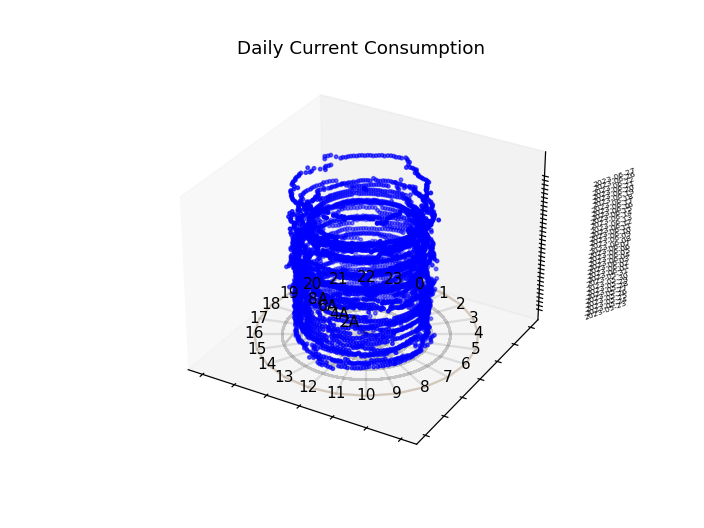

C:\Users\me1mna\Anaconda3\envs\notebook\lib\site-packages\ipykernel_launcher.py:82: UserWarning:

Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.



In [34]:
# Convert theta from hours to radians
time_seconds = df['Time'].tolist()
time_hours = np.array(time_seconds) / 3600
theta = np.radians(time_hours * 15)

# Convert date to numeric values
dates = pd.to_datetime(df['Date'])
ref_date = min(dates)  # Choose a reference date
days_since_ref = (dates - ref_date).dt.days

# Calculate x, y coordinates
x = 20 * np.pi * (df['Value'] * np.cos(theta))
y = 20 * np.pi * (df['Value'] * np.sin(theta))

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Get unique dates and their corresponding indices
unique_dates, date_indices = np.unique(dates, return_inverse=True)

# Plot points with distinct colors
scatter = ax.scatter(x, y, days_since_ref, c='blue', marker='.', label='Points')

# Define clock labels and calculate clock coordinates
clock_labels = ['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13', '14', '15', '16', '17', '18',
                '19', '20', '21', '22', '23']
num_segments = len(clock_labels)
theta_clock = np.linspace(0, 2 * np.pi, num_segments, endpoint=False)
clock_x = 20 * np.pi * 12 * np.sin(theta_clock)
clock_y = 20 * np.pi * 12 * np.cos(theta_clock)

# Connect the clock circle
clock_x = np.append(clock_x, clock_x[0])
clock_y = np.append(clock_y, clock_y[0])

# Plot the clock
ax.plot(clock_x, clock_y, np.zeros_like(clock_x), alpha=0.2)  # Connect the clock circle
ax.plot(clock_x[:-1], clock_y[:-1], np.zeros_like(clock_x[:-1]), alpha=0.2)  # Plot ticks on the clock

# Add labels to the clock circumference and connect them to the center
for x_clock, y_clock, label in zip(clock_x[:-1], clock_y[:-1], clock_labels):
    ax.text(x_clock, y_clock, 0, label, ha='center', va='center')
    ax.plot([x_clock, 0], [y_clock, 0], [0, 0], 'k', alpha=0.1)

# Plot additional circles with labels
circle_labels = ['2A', '4A', '6A', '8A']
circle_coordinates = [(20 * np.pi * (i + 1) * np.cos(theta), 20 * np.pi * (i + 1) * np.sin(theta)) for i in range(2, 10, 2)]

for label, (x_circle, y_circle) in zip(circle_labels, circle_coordinates):
    ax.plot(x_circle, y_circle, np.zeros_like(x_circle), color='black', alpha=0.2, label=f'Circle with radius {label}')
    ax.text(x_circle[0], y_circle[0], 0, label, color='black', ha='center', va='center')
    ax.plot([x_circle[0], 0], [y_circle[0], 0], [0, 0], 'k', alpha=0.2)

# Set labels and title
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_zlabel('')
ax.set_title('Daily Current Consumption')

# Set z-axis tick labels with distinct colors and date format
ax.set_zticks(np.unique(date_indices))
ax.set_zticklabels(pd.DatetimeIndex(unique_dates).strftime('%Y-%m-%d'),fontsize=5, rotation=20)
ax.grid(False)
# Adjust the spacing of z-axis tick labels
ax.tick_params(axis='z', pad=20)
# Remove tick labels from x and y axes
ax.set_xticklabels([])
ax.set_yticklabels([])

# Add a legend with dates and their corresponding colors
#legend_labels = pd.DatetimeIndex(unique_dates).strftime('%Y-%m-%d').tolist()
#legend_colors = cm.tab20(np.linspace(0, 1, len(unique_dates)))
#legend_handles = [plt.Line2D([0], [0], marker='.', color='w', markerfacecolor=c, markersize=10) for c in legend_colors]
#legend_handles.append(scatter)
#legend_labels.append('Points')
#legend = ax.legend(legend_handles, legend_labels, loc='upper left', title='Date', facecolor='white')

# Move the legend to the right side
#plt.gca().add_artist(legend)

# Adjust the layout to prevent overlapping
plt.tight_layout()
image_name = f"{sim}_Daily Current Consumption.png"
plt.savefig (image_name)
# Show the plot
plt.show()

In [68]:
df.head(10)

,DataMessageGUID,SensorID,Sensor Name,Value,Formatted Value,Battery,Raw Data,Sensor State,GatewayID,Alert Sent,Signal Strength,Voltage,phase1_avg,phase1_max,phase1_min,phase1_duty,phase2_avg,phase2_max,phase2_min,phase2_duty,phase3_avg,phase3_max,phase3_min,phase3_duty,value_Ah,sensor_state,Date,Time,phase1-2,phase2-3,phase1-3,Day,time_hours,dbscan clusters,cluster
Timestamp,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2023-06-27 10:25:00,e65704de-ba5f-4748-9a25-505f441c1d4c,683664,B737MAX-8-M-03,7.4,"7.4 Ah | Phase 1: Min 17, Max 19, Avg 17.79, ...",100,17.79|19|17|100|14.87|16|14|100|11.68|13|11|10...,0,965435,False,58,3.31,17.79,19.0,17.0,100.0,14.87,16.0,14.0,100.0,11.68,13.0,11.0,100.0,7.4,0.0,2023-06-27,37500,2.92,3.19,6.11,35,10.416667,-1,0
2023-06-27 10:15:00,ac4ab498-4859-4ca0-b1d7-abdc656e75d2,683664,B737MAX-8-M-03,7.9,"7.9 Ah | Phase 1: Min 18, Max 19, Avg 18.7, D...",100,18.7|19|18|100|15.73|16|15|100|12.8|13|12|100|...,0,965435,False,58,3.31,18.70,19.0,18.0,100.0,15.73,16.0,15.0,100.0,12.80,13.0,12.0,100.0,7.9,0.0,2023-06-27,36900,2.97,2.93,5.90,35,10.250000,-1,0
2023-06-27 10:05:00,e39fc212-b8bb-4721-8186-c36c1496b376,683664,B737MAX-8-M-03,7.8,"7.8 Ah | Phase 1: Min 18, Max 18, Avg 18.62, ...",100,18.62|18|18|100|15.59|15|15|100|12.71|13|12|10...,0,965435,False,43,3.31,18.62,18.0,18.0,100.0,15.59,15.0,15.0,100.0,12.71,13.0,12.0,100.0,7.8,0.0,2023-06-27,36300,3.03,2.88,5.91,35,10.083333,-1,0
2023-06-27 09:55:00,13918862-80e2-41b8-8b9b-3972639f8547,683664,B737MAX-8-M-03,7.8,"7.8 Ah | Phase 1: Min 17, Max 20, Avg 18.54, ...",100,18.54|20|17|100|15.4|16|14|100|12.54|14|11|100...,0,965435,False,31,3.31,18.54,20.0,17.0,100.0,15.40,16.0,14.0,100.0,12.54,14.0,11.0,100.0,7.8,0.0,2023-06-27,35700,3.14,2.86,6.00,35,9.916667,-1,0
2023-06-27 09:45:00,7e2afd13-5aa5-4b4d-817d-db75e66d81ed,683664,B737MAX-8-M-03,7.2,"7.2 Ah | Phase 1: Min 16, Max 17, Avg 17.34, ...",100,17.34|17|16|100|14.36|14|13|100|11.51|11|11|10...,0,965435,False,63,3.31,17.34,17.0,16.0,100.0,14.36,14.0,13.0,100.0,11.51,11.0,11.0,100.0,7.2,0.0,2023-06-27,35100,2.98,2.85,5.83,35,9.750000,0,0
2023-06-27 09:35:00,73e21b51-dc93-47d4-ace7-cba3465a26b5,683664,B737MAX-8-M-03,6.7,"6.7 Ah | Phase 1: Min 13, Max 16, Avg 14.92, ...",100,14.92|16|13|100|13.9|14|12|100|11.45|11|11|100...,0,965435,False,43,3.31,14.92,16.0,13.0,100.0,13.90,14.0,12.0,100.0,11.45,11.0,11.0,100.0,6.7,0.0,2023-06-27,34500,1.02,2.45,3.47,35,9.583333,0,0
2023-06-27 09:25:00,74af4c4b-022b-4f56-8484-57ec22df40e3,683664,B737MAX-8-M-03,6.8,"6.8 Ah | Phase 1: Min 14, Max 14, Avg 14.8, D...",100,14.8|14|14|100|14.38|14|14|100|11.46|11|11|100...,0,965435,False,29,3.31,14.80,14.0,14.0,100.0,14.38,14.0,14.0,100.0,11.46,11.0,11.0,100.0,6.8,0.0,2023-06-27,33900,0.42,2.92,3.34,35,9.416667,0,0
2023-06-27 09:15:00,5b0ad7e9-e39a-4341-9302-39b488fbece9,683664,B737MAX-8-M-03,6.7,"6.7 Ah | Phase 1: Min 14, Max 14, Avg 14.76, ...",100,14.76|14|14|100|14.38|14|14|100|11.59|12|11|10...,0,965435,False,46,3.31,14.76,14.0,14.0,100.0,14.38,14.0,14.0,100.0,11.59,12.0,11.0,100.0,6.7,0.0,2023-06-27,33300,0.38,2.79,3.17,35,9.250000,0,0
2023-06-27 09:05:00,4217b189-a00b-43df-9d8d-a3d426bee521,683664,B737MAX-8-M-03,6.8,"6.8 Ah | Phase 1: Min 14, Max 14, Avg 14.81, ...",100,14.81|14|14|100|14.37|14|14|100|11.48|11|11|10...,0,965435,False,53,3.31,14.81,14.0,14.0,100.0,14.37,14.0,14.0,100.0,11.48,11.0,11.0,100.0,6.8,0.0,2023-06-27,32700,0.44,2.89,3.33,35,9.083333,0,0


<IPython.core.display.Javascript object>


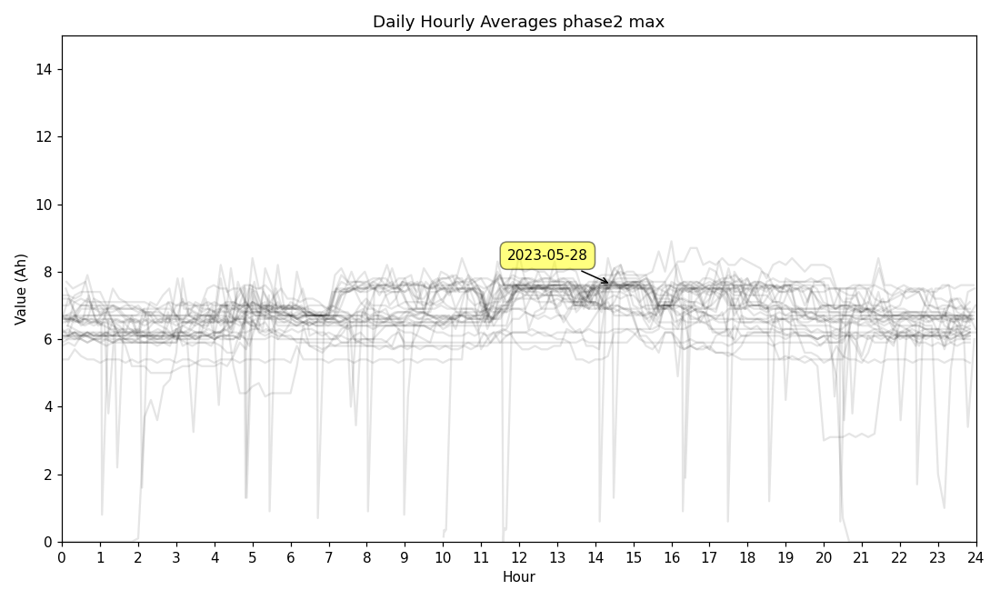

In [78]:


# Calculate daily hourly averages
df_avg = df.groupby([df.index.date, df['Time'] / 3600])['Value'].mean().reset_index()
df_avg.columns = ['Date', 'Hour', 'Average']



# Algorthims


# 1. KMEANS++

In [35]:
# Calculate the number of days since the earliest date
df['Day'] = (df['Date'] - df['Date'].min()).dt.days
df.head(10)

,DataMessageGUID,SensorID,Sensor Name,Value,Formatted Value,Battery,Raw Data,Sensor State,GatewayID,Alert Sent,Signal Strength,Voltage,phase1_avg,phase1_max,phase1_min,phase1_duty,phase2_avg,phase2_max,phase2_min,phase2_duty,phase3_avg,phase3_max,phase3_min,phase3_duty,value_Ah,sensor_state,Date,Time,phase1-2,phase2-3,phase1-3,Day
Timestamp,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2023-06-27 10:25:00,e65704de-ba5f-4748-9a25-505f441c1d4c,683664,B737MAX-8-M-03,7.4,"7.4 Ah | Phase 1: Min 17, Max 19, Avg 17.79, ...",100,17.79|19|17|100|14.87|16|14|100|11.68|13|11|10...,0,965435,False,58,3.31,17.79,19.0,17.0,100.0,14.87,16.0,14.0,100.0,11.68,13.0,11.0,100.0,7.4,0.0,2023-06-27,37500,2.92,3.19,6.11,35
2023-06-27 10:15:00,ac4ab498-4859-4ca0-b1d7-abdc656e75d2,683664,B737MAX-8-M-03,7.9,"7.9 Ah | Phase 1: Min 18, Max 19, Avg 18.7, D...",100,18.7|19|18|100|15.73|16|15|100|12.8|13|12|100|...,0,965435,False,58,3.31,18.70,19.0,18.0,100.0,15.73,16.0,15.0,100.0,12.80,13.0,12.0,100.0,7.9,0.0,2023-06-27,36900,2.97,2.93,5.90,35
2023-06-27 10:05:00,e39fc212-b8bb-4721-8186-c36c1496b376,683664,B737MAX-8-M-03,7.8,"7.8 Ah | Phase 1: Min 18, Max 18, Avg 18.62, ...",100,18.62|18|18|100|15.59|15|15|100|12.71|13|12|10...,0,965435,False,43,3.31,18.62,18.0,18.0,100.0,15.59,15.0,15.0,100.0,12.71,13.0,12.0,100.0,7.8,0.0,2023-06-27,36300,3.03,2.88,5.91,35
2023-06-27 09:55:00,13918862-80e2-41b8-8b9b-3972639f8547,683664,B737MAX-8-M-03,7.8,"7.8 Ah | Phase 1: Min 17, Max 20, Avg 18.54, ...",100,18.54|20|17|100|15.4|16|14|100|12.54|14|11|100...,0,965435,False,31,3.31,18.54,20.0,17.0,100.0,15.40,16.0,14.0,100.0,12.54,14.0,11.0,100.0,7.8,0.0,2023-06-27,35700,3.14,2.86,6.00,35
2023-06-27 09:45:00,7e2afd13-5aa5-4b4d-817d-db75e66d81ed,683664,B737MAX-8-M-03,7.2,"7.2 Ah | Phase 1: Min 16, Max 17, Avg 17.34, ...",100,17.34|17|16|100|14.36|14|13|100|11.51|11|11|10...,0,965435,False,63,3.31,17.34,17.0,16.0,100.0,14.36,14.0,13.0,100.0,11.51,11.0,11.0,100.0,7.2,0.0,2023-06-27,35100,2.98,2.85,5.83,35
2023-06-27 09:35:00,73e21b51-dc93-47d4-ace7-cba3465a26b5,683664,B737MAX-8-M-03,6.7,"6.7 Ah | Phase 1: Min 13, Max 16, Avg 14.92, ...",100,14.92|16|13|100|13.9|14|12|100|11.45|11|11|100...,0,965435,False,43,3.31,14.92,16.0,13.0,100.0,13.90,14.0,12.0,100.0,11.45,11.0,11.0,100.0,6.7,0.0,2023-06-27,34500,1.02,2.45,3.47,35
2023-06-27 09:25:00,74af4c4b-022b-4f56-8484-57ec22df40e3,683664,B737MAX-8-M-03,6.8,"6.8 Ah | Phase 1: Min 14, Max 14, Avg 14.8, D...",100,14.8|14|14|100|14.38|14|14|100|11.46|11|11|100...,0,965435,False,29,3.31,14.80,14.0,14.0,100.0,14.38,14.0,14.0,100.0,11.46,11.0,11.0,100.0,6.8,0.0,2023-06-27,33900,0.42,2.92,3.34,35
2023-06-27 09:15:00,5b0ad7e9-e39a-4341-9302-39b488fbece9,683664,B737MAX-8-M-03,6.7,"6.7 Ah | Phase 1: Min 14, Max 14, Avg 14.76, ...",100,14.76|14|14|100|14.38|14|14|100|11.59|12|11|10...,0,965435,False,46,3.31,14.76,14.0,14.0,100.0,14.38,14.0,14.0,100.0,11.59,12.0,11.0,100.0,6.7,0.0,2023-06-27,33300,0.38,2.79,3.17,35
2023-06-27 09:05:00,4217b189-a00b-43df-9d8d-a3d426bee521,683664,B737MAX-8-M-03,6.8,"6.8 Ah | Phase 1: Min 14, Max 14, Avg 14.81, ...",100,14.81|14|14|100|14.37|14|14|100|11.48|11|11|10...,0,965435,False,53,3.31,14.81,14.0,14.0,100.0,14.37,14.0,14.0,100.0,11.48,11.0,11.0,100.0,6.8,0.0,2023-06-27,32700,0.44,2.89,3.33,35


In [36]:
idx=df.columns.get_loc("Value")
print("Column Index : "+ str(idx))


Column Index : 3


In [37]:
# create two dimentional matrix 
x=df.loc[:,['Day', 'Value']].values

C:\Users\me1mna\Anaconda3\envs\notebook\lib\site-packages\sklearn\cluster\_kmeans.py:1037: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=18.



<IPython.core.display.Javascript object>


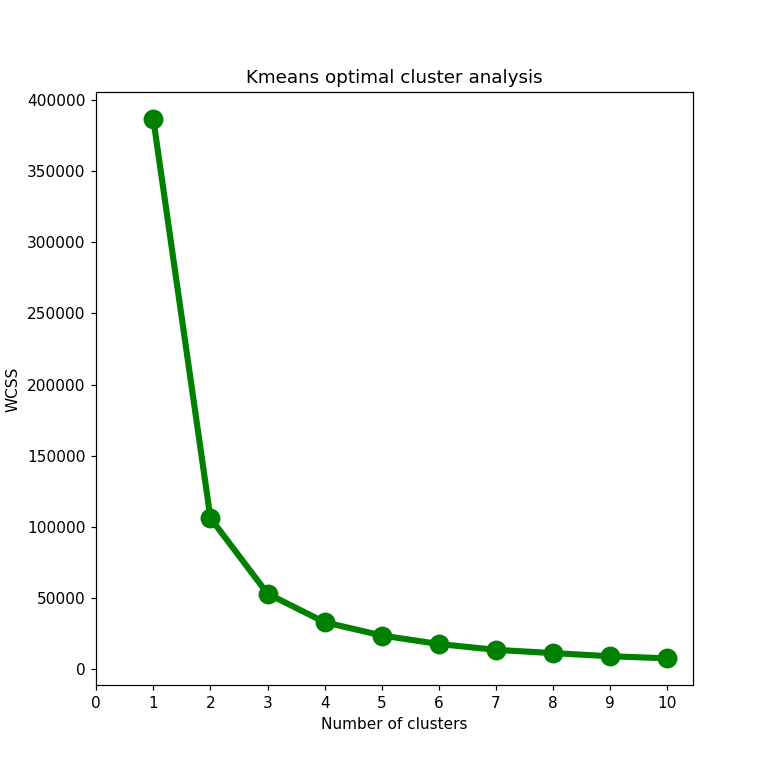

In [38]:
# find the optimal number of clusters using elbow method

WCSS = []
for i in range(1,11):
    model = KMeans(n_clusters = i,init = 'k-means++')
    model.fit(x)
    WCSS.append(model.inertia_)
fig = plt.figure(figsize = (7,7))
plt.plot(range(1,11),WCSS, linewidth=4, markersize=12,marker='o',color = 'green')
plt.xticks(np.arange(11))
plt.title('Kmeans optimal cluster analysis')
plt.xlabel("Number of clusters")
plt.ylabel("WCSS")
image_name = f"{sim}_Kmeans Cluster Size prediction.png"
plt.savefig (image_name)
plt.show()

<IPython.core.display.Javascript object>


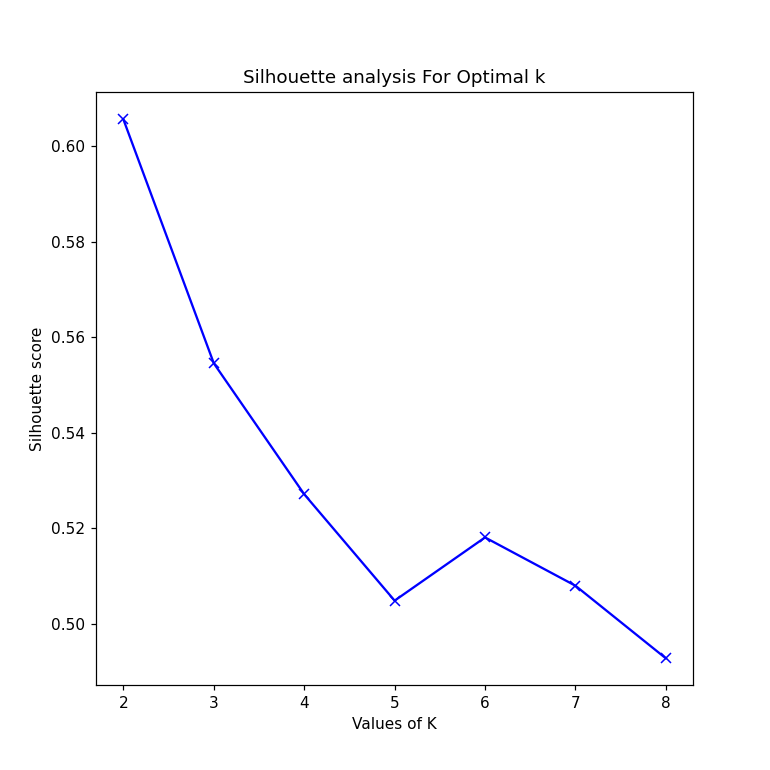

In [39]:
from sklearn.metrics import silhouette_score
range_n_clusters = [2, 3, 4, 5, 6, 7, 8]
silhouette_avg = []
for num_clusters in range_n_clusters:
 
 # initialise kmeans
 kmeans = KMeans(n_clusters=num_clusters)
 kmeans.fit(x)
 cluster_labels = kmeans.labels_
 
 # silhouette score
 silhouette_avg.append(silhouette_score(x, cluster_labels))
fig = plt.figure(figsize = (7,7))
plt.plot(range_n_clusters,silhouette_avg,'bx-')
plt.xlabel('Values of K') 
plt.ylabel('Silhouette score') 
plt.title('Silhouette analysis For Optimal k')
image_name = f"{sim}_Silhoute score for Kmeans Cluster.png"
plt.savefig (image_name)
plt.show()

In [40]:
# since elbow occured at 3, hence the optimal number of clusters for the mall data is 3 

model = KMeans(n_clusters = 2, init = "k-means++", max_iter = 300, n_init = 10, random_state = 0)
y_clusters = model.fit_predict(x)

<IPython.core.display.Javascript object>


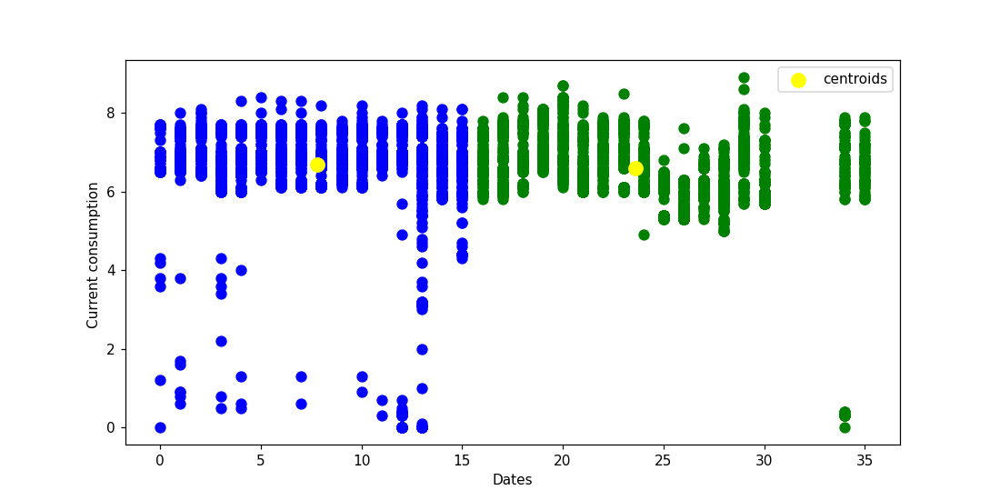

In [41]:
plt.figure(figsize = (10,5))
plt.scatter(x[y_clusters == 0,0],x[y_clusters == 0,1],s = 50, c = 'green')
plt.scatter(x[y_clusters == 1,0],x[y_clusters == 1,1],s = 50, c = 'blue')
#plt.scatter(x[y_clusters == 2,0],x[y_clusters == 2,1],s = 50, c = 'black')
#plt.scatter(x[y_clusters == 3,0],x[y_clusters == 3,1],s = 50, c = 'red')
#plt.scatter(x[y_clusters == 4,0],x[y_clusters == 4,1],s = 50, c = 'pink')
plt.scatter(model.cluster_centers_[:,0],model.cluster_centers_[:,1], s = 100, c = "yellow", label = "centroids")
plt.xlabel("Dates")
plt.ylabel("Current consumption ")
plt.legend()
image_name = f"{sim}_Kmeans 2D clustering.png"
plt.savefig (image_name)
plt.show()

In [42]:
df['time_hours']=df['Time']/3600

In [43]:
#include third variable and make prediction with time number of days and current value
x1 = df[['Day','Value','time_hours']].values

C:\Users\me1mna\Anaconda3\envs\notebook\lib\site-packages\sklearn\cluster\_kmeans.py:1037: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=18.



<IPython.core.display.Javascript object>


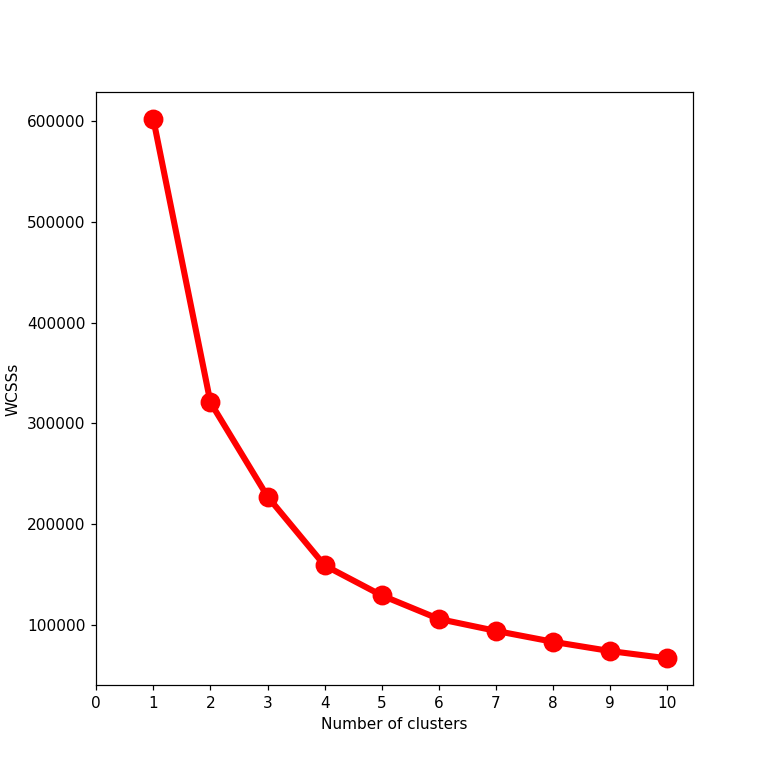

In [44]:
# find the optimal number of clusters using elbow method  -- >This is for 3 features = [age,anual income,spending score]

WCSSs = []
for i in range(1,11):
    model = KMeans(n_clusters = i,init = 'k-means++')
    model.fit(x1)
    WCSSs.append(model.inertia_)
fig = plt.figure(figsize = (7,7))
plt.plot(range(1,11),WCSSs, linewidth=4, markersize=12,marker='o',color = 'red')
plt.xticks(np.arange(11))
plt.xlabel("Number of clusters")
plt.ylabel("WCSSs")
image_name = f"{sim}_Kmeans 3d cluster analysis.png"
plt.savefig (image_name)
plt.show()

<IPython.core.display.Javascript object>


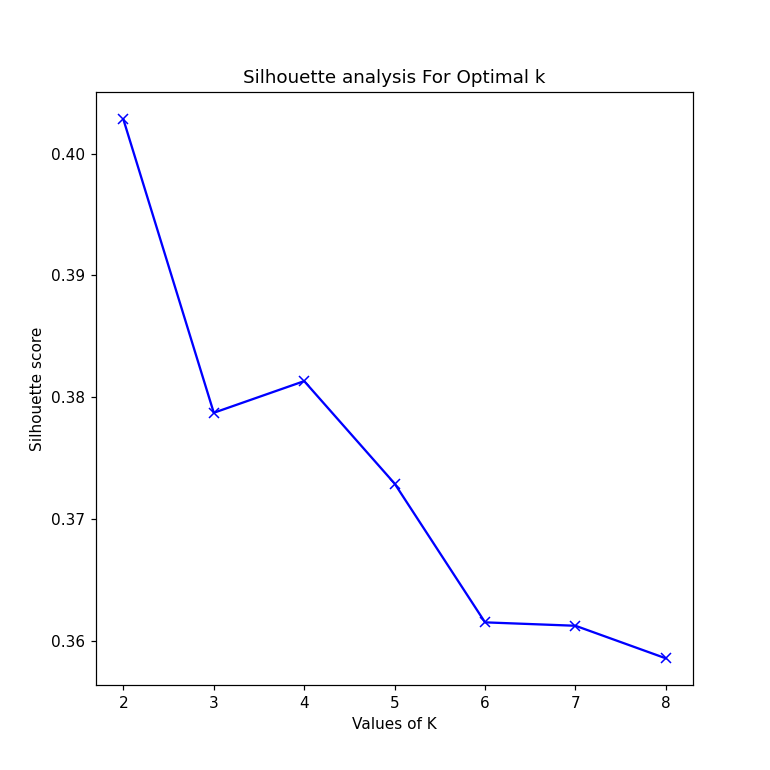

In [45]:
range_n_clusters = [2, 3, 4, 5, 6, 7, 8]
silhouette_avg = []
for num_clusters in range_n_clusters:
 
 # initialise kmeans
 kmeans = KMeans(n_clusters=num_clusters)
 kmeans.fit(x1)
 cluster_labels = kmeans.labels_
 
 # silhouette score
 silhouette_avg.append(silhouette_score(x1, cluster_labels))
fig = plt.figure(figsize = (7,7))
plt.plot(range_n_clusters,silhouette_avg,'bx-')
plt.xlabel('Values of K') 
plt.ylabel('Silhouette score') 
plt.title('Silhouette analysis For Optimal k')
image_name = f"{sim}_Kmeans 3d cluster Silhoutte score.png"
plt.savefig (image_name)
plt.show()

In [46]:
# finding the clusters based on input matrix "x"
model = KMeans(n_clusters = 4, init = "k-means++", max_iter = 300, n_init = 10, random_state = 0)
y_clusters = model.fit_predict(x1)

<IPython.core.display.Javascript object>


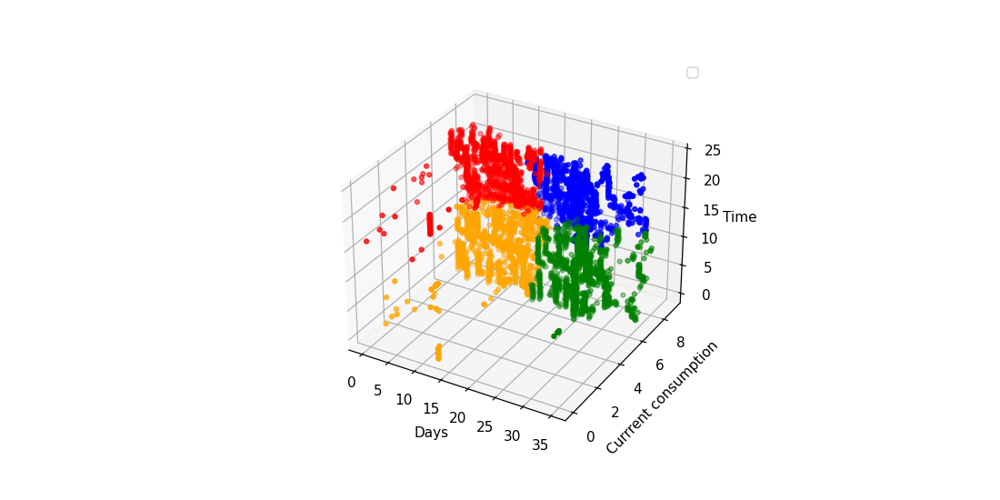

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


In [47]:
# 3d scatterplot using matplotlib

fig = plt.figure(figsize = (10,5))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(x1[y_clusters == 0,0],x1[y_clusters == 0,1],x1[y_clusters == 0,2], s = 10 , color = 'blue')
ax.scatter(x1[y_clusters == 1,0],x1[y_clusters == 1,1],x1[y_clusters == 1,2], s = 10 , color = 'orange')
ax.scatter(x1[y_clusters == 2,0],x1[y_clusters == 2,1],x1[y_clusters == 2,2], s = 10 , color = 'green')
ax.scatter(x1[y_clusters == 3,0],x1[y_clusters == 3,1],x1[y_clusters == 3,2], s = 10 , color = 'Red')
#ax.scatter(x[y_clusters == 4,0],x[y_clusters == 4,1],x[y_clusters == 4,2], s = 40 , color = 'purple', label = "cluster 4")
ax.set_xlabel('Days')
ax.set_ylabel('Currrent consumption')
ax.set_zlabel('Time')
image_name = f"{sim}_Kmeans 3d clustering.png"
plt.savefig (image_name)
ax.legend()
plt.show()

# DBSCAN Algorithm

In [48]:
from sklearn.cluster import DBSCAN
df1=df[['Day', 'Value']]
Day, Value = df.Day, df.Value
X=df1.to_numpy()
dbscan_cluster_model =DBSCAN(eps=0.21842105263157896, min_samples=13).fit(X)
dbscan_cluster_model

DBSCAN(eps=0.21842105263157896, min_samples=13)

In [49]:
df['dbscan clusters']=dbscan_cluster_model.labels_

In [50]:
df['dbscan clusters'].value_counts()


-1     153
 34    144
 36    144
 26    144
 7     144
 20    144
 17    144
 45    143
 37    143
 35    142
 46    142
 28    142
 10    142
 19    142
 40    142
 18    141
 39    140
 38    139
 27    131
 12    125
 8     124
 13    122
 43    121
 5     120
 33    119
 15    114
 24    110
 41     99
 21     87
 4      76
 29     66
 0      58
 42     43
 1      37
 30     36
 47     34
 25     33
 16     29
 23     29
 2      27
 22     26
 32     22
 6      22
 14     21
 3      19
 11     18
 9      18
 44     17
 31     13
Name: dbscan clusters, dtype: int64

In [51]:
import plotly.express as px
fig = px.scatter(x=Day, y= Value, color=df['dbscan clusters'])
fig.show()

In [52]:
from sklearn.metrics import silhouette_score as ss
ss(X,df['dbscan clusters'])

0.536655090277483

In [53]:
epsilon= np.linspace(0.01,1,num=20)
epsilon

array([0.01      , 0.06210526, 0.11421053, 0.16631579, 0.21842105,
       0.27052632, 0.32263158, 0.37473684, 0.42684211, 0.47894737,
       0.53105263, 0.58315789, 0.63526316, 0.68736842, 0.73947368,
       0.79157895, 0.84368421, 0.89578947, 0.94789474, 1.        ])

In [54]:
min_samples=np.arange(1,20, step=2)
min_samples

array([ 1,  3,  5,  7,  9, 11, 13, 15, 17, 19])

In [55]:
import itertools 
combinations =list(itertools.product(epsilon, min_samples))
combinations
N=len(combinations)
N

200

In [56]:
def get_scores_and_labels(combinations, X):
  scores = []
  all_labels_list = []

  for i, (eps, num_samples) in enumerate(combinations):
    dbscan_cluster_model = DBSCAN(eps=eps, min_samples=num_samples).fit(X)
    labels = dbscan_cluster_model.labels_
    labels_set = set(labels)
    num_clusters = len(labels_set)
    if -1 in labels_set:
      num_clusters -= 1
    
    if (num_clusters < 2) or (num_clusters > 50):
      scores.append(-10)
      all_labels_list.append('bad')
      c = (eps, num_samples)
      print(f"Combination {c} on iteration {i+1} of {N} has {num_clusters} clusters. Moving on")
      continue
    
    scores.append(ss(X, labels))
    all_labels_list.append(labels)
    print(f"Index: {i}, Score: {scores[-1]}, Labels: {all_labels_list[-1]}, NumClusters: {num_clusters}")

  best_index = np.argmax(scores)
  best_parameters = combinations[best_index]
  best_labels = all_labels_list[best_index]
  best_score = scores[best_index]

  return {'best_epsilon': best_parameters[0],
          'best_min_samples': best_parameters[1], 
          'best_labels': best_labels,
          'best_score': best_score}

best_dict = get_scores_and_labels(combinations, X)

Combination (0.01, 1) on iteration 1 of 200 has 657 clusters. Moving on
Combination (0.01, 3) on iteration 2 of 200 has 416 clusters. Moving on
Combination (0.01, 5) on iteration 3 of 200 has 300 clusters. Moving on
Combination (0.01, 7) on iteration 4 of 200 has 226 clusters. Moving on
Combination (0.01, 9) on iteration 5 of 200 has 168 clusters. Moving on
Combination (0.01, 11) on iteration 6 of 200 has 130 clusters. Moving on
Combination (0.01, 13) on iteration 7 of 200 has 102 clusters. Moving on
Combination (0.01, 15) on iteration 8 of 200 has 77 clusters. Moving on
Combination (0.01, 17) on iteration 9 of 200 has 68 clusters. Moving on
Combination (0.01, 19) on iteration 10 of 200 has 53 clusters. Moving on
Combination (0.06210526315789474, 1) on iteration 11 of 200 has 657 clusters. Moving on
Combination (0.06210526315789474, 3) on iteration 12 of 200 has 416 clusters. Moving on
Combination (0.06210526315789474, 5) on iteration 13 of 200 has 300 clusters. Moving on
Combination (

Index: 96, Score: 0.525336957999848, Labels: [ 0  0  0 ... 35 -1 -1], NumClusters: 36
Index: 97, Score: 0.5205743579599493, Labels: [ 0 -1 -1 ... 34 -1 -1], NumClusters: 35
Index: 98, Score: 0.5197679463630492, Labels: [ 0 -1 -1 ... 34 -1 -1], NumClusters: 35
Index: 99, Score: 0.5177748622365576, Labels: [ 0 -1 -1 ... -1 -1 -1], NumClusters: 35
Combination (0.5310526315789474, 1) on iteration 101 of 200 has 60 clusters. Moving on
Index: 101, Score: 0.5281435351770296, Labels: [ 0  0  0 ... 37 -1 38], NumClusters: 39
Index: 102, Score: 0.5327650009134832, Labels: [ 0  0  0 ... 36 -1 -1], NumClusters: 37
Index: 103, Score: 0.5358566724040688, Labels: [ 0  0  0 ... 37 -1 -1], NumClusters: 38
Index: 104, Score: 0.5358566724040688, Labels: [ 0  0  0 ... 37 -1 -1], NumClusters: 38
Index: 105, Score: 0.5305238515142596, Labels: [ 0  0  0 ... 36 -1 -1], NumClusters: 37
Index: 106, Score: 0.5243246388405536, Labels: [ 0  0  0 ... 34 -1 -1], NumClusters: 35
Index: 107, Score: 0.5200922893592682,

Index: 190, Score: -0.45552727143795085, Labels: [ 0  0  0 ...  2 13 11], NumClusters: 14
Index: 191, Score: -0.10328551087219116, Labels: [ 0  0  0 ...  2 -1  6], NumClusters: 7
Index: 192, Score: -0.1626249134793471, Labels: [ 0  0  0 ...  2 -1  5], NumClusters: 6
Index: 193, Score: -0.12960431097778063, Labels: [ 0  0  0 ...  2 -1 -1], NumClusters: 4
Index: 194, Score: -0.12960431097778063, Labels: [ 0  0  0 ...  2 -1 -1], NumClusters: 4
Index: 195, Score: -0.05310916861174757, Labels: [ 0  0  0 ...  1 -1 -1], NumClusters: 3
Index: 196, Score: -0.05477889439951437, Labels: [ 0  0  0 ...  1 -1 -1], NumClusters: 3
Index: 197, Score: -0.055161311873964454, Labels: [ 0  0  0 ...  1 -1 -1], NumClusters: 3
Index: 198, Score: -0.05362150388171533, Labels: [ 0  0  0 ...  1 -1 -1], NumClusters: 3
Index: 199, Score: -0.05362150388171533, Labels: [ 0  0  0 ...  1 -1 -1], NumClusters: 3


In [57]:
best_dict

{'best_epsilon': 0.4268421052631579,
 'best_min_samples': 3,
 'best_labels': array([ 0,  0,  0, ..., 40, -1, 41], dtype=int64),
 'best_score': 0.5387774829602711}

In [58]:
df['cluster'] = best_dict['best_labels']

df['cluster'].value_counts()

 18    144
 12    144
 33    144
 29    144
 27    144
 21    144
 16    144
 15    144
 14    144
 13    144
 37    144
 8     144
 6     144
 5     144
 9     143
 17    143
 38    143
 28    143
 30    143
 4     142
 32    142
 7     142
 34    142
 31    141
 35    138
 19    135
 26    120
 22    118
 10    114
 3      90
 1      83
 0      63
 40     43
 25     32
-1      32
 11     29
 24     13
 23     11
 2      10
 20      9
 39      4
 41      4
 36      3
Name: cluster, dtype: int64

In [59]:
df['cluster']

Timestamp
2023-06-27 10:25:00     0
2023-06-27 10:15:00     0
2023-06-27 10:05:00     0
2023-06-27 09:55:00     0
2023-06-27 09:45:00     0
2023-06-27 09:35:00     0
2023-06-27 09:25:00     0
2023-06-27 09:15:00     0
2023-06-27 09:05:00     0
2023-06-27 08:55:00     0
2023-06-27 08:45:00     0
2023-06-27 08:35:00     0
2023-06-27 08:25:00     0
2023-06-27 08:15:00     0
2023-06-27 08:05:00     0
2023-06-27 07:55:00     0
2023-06-27 07:45:00     0
2023-06-27 07:35:00     0
2023-06-27 07:25:00     0
2023-06-27 07:15:00     0
2023-06-27 07:05:00     0
2023-06-27 06:55:00     0
2023-06-27 06:45:00     0
2023-06-27 06:35:00     0
2023-06-27 06:25:00     0
2023-06-27 06:15:00     0
2023-06-27 06:05:00     0
2023-06-27 05:55:00     0
2023-06-27 05:45:00     0
2023-06-27 05:35:00     0
2023-06-27 05:25:00     0
2023-06-27 05:15:00     0
2023-06-27 05:05:00     0
2023-06-27 04:55:00     0
2023-06-27 04:45:00     0
2023-06-27 04:35:00     0
2023-06-27 04:25:00     0
2023-06-27 04:15:00     0
20

In [60]:
fig = px.scatter(x=Day, y=Value, color=df['cluster'], title="DBSCAN Clustering using optimal value of Epsilon")
fig.show()

<IPython.core.display.Javascript object>


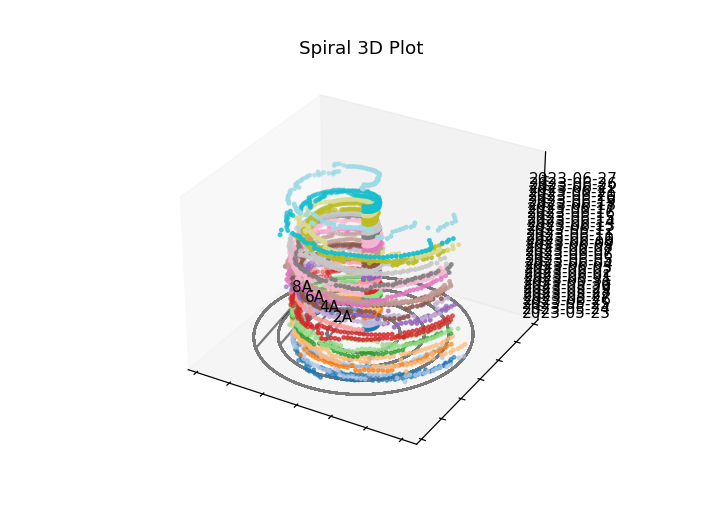

C:\Users\me1mna\Anaconda3\envs\notebook\lib\site-packages\ipykernel_launcher.py:60: UserWarning:

Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.



In [61]:


# Convert theta from hours to radians
time_seconds = df['Time'].tolist()
time_hours = np.array(time_seconds) / 3600
theta = np.radians(time_hours * 15)

# Convert date to numeric values
dates = pd.to_datetime(df['Date'])
ref_date = min(dates)  # Choose a reference date
days_since_ref = (dates - ref_date).dt.days
# Merge the dataframes based on the common 'x' column
#merged_df = (days_since_ref*time_hours)/5
# Calculate x, y coordinates
x = 4* np.pi * (df['Value'] * np.cos(theta))*theta
y = 4*np.pi * (df['Value'] * np.sin(theta))*theta

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Get unique dates and their corresponding indices
unique_dates, date_indices = np.unique(dates, return_inverse=True)

# Plot points with distinct colors
scatter = ax.scatter(x, y,days_since_ref , c=date_indices, cmap='tab20', marker='.', label='Points')

# Plot additional circles with labels
circle_labels = ['2A', '4A', '6A', '8A']
circle_coordinates = [(20 * np.pi * (i + 1) * np.cos(theta), 20 * np.pi * (i + 1) * np.sin(theta)) for i in range(2, 10, 2)]

for label, (x_circle, y_circle) in zip(circle_labels, circle_coordinates):
    ax.plot(x_circle, y_circle, 0, color='black', alpha=0.5, label=f'Circle with radius {label}')
    ax.text(x_circle[0], y_circle[0], 0, label, color='black', ha='center', va='center')

# Set labels and title
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_zlabel('')
ax.set_title('Spiral 3D Plot')

# Set z-axis tick labels with distinct colors and date format
ax.set_zticks(np.unique(date_indices))
ax.set_zticklabels(pd.DatetimeIndex(unique_dates).strftime('%Y-%m-%d'))
ax.grid(False)

# Remove tick labels from x and y axes
ax.set_xticklabels([])
ax.set_yticklabels([])

# Add a legend with dates and their corresponding colors
#legend_labels = pd.DatetimeIndex(unique_dates).strftime('%Y-%m-%d').tolist()
#legend_colors = cm.tab20(np.linspace(0, 1, len(unique_dates)))
#legend_handles = [plt.Line2D([0], [0], marker='.', color='w', markerfacecolor=c, markersize=10) for c in legend_colors]
#legend_handles.append(scatter)
#legend_labels.append('Points')
#legend = ax.legend(legend_handles, legend_labels, loc='upper left', title='Date', facecolor='white')

# Move the legend to the right side
#plt.gca().add_artist(legend)

# Adjust the layout to prevent overlapping
plt.tight_layout()

# Show the plot
plt.show()


<IPython.core.display.Javascript object>


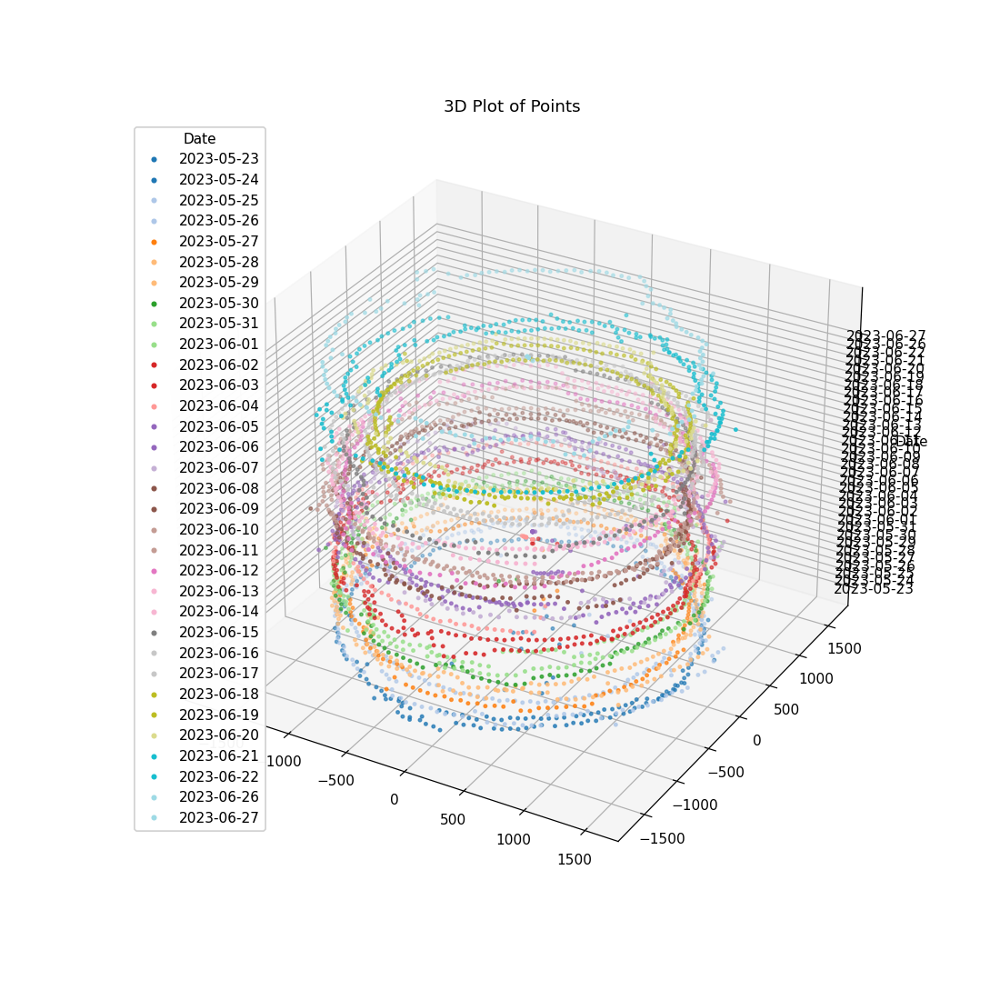

C:\Users\me1mna\Anaconda3\envs\notebook\lib\site-packages\ipykernel_launcher.py:50: UserWarning:

Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.



In [62]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.cm as cm

# Convert theta from hours to radians
time_seconds = df['Time'].tolist()
time_hours = np.array(time_seconds) / 3600
theta = np.radians(time_hours * 15)

# Convert date to numeric values
dates = pd.to_datetime(df['Date'])
ref_date = min(dates)  # Choose a reference date
days_since_ref = (dates - ref_date).dt.days

# Calculate x, y, and z coordinates
x = 20*3.14 * np.pi * (df['Value'] * np.cos(theta))
y = 20*3.14 * np.pi * (df['Value'] * np.sin(theta))
z = days_since_ref

# Create a 3D plot
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111, projection='3d')

# Get unique dates and their corresponding indices
unique_dates, date_indices = np.unique(dates, return_inverse=True)

# Plot points with distinct colors
scatter = ax.scatter(x, y, z, c=date_indices, cmap='tab20', marker='.', label='Points')

# Set labels and title
ax.set_zlabel('Date')
ax.set_title('3D Plot of Points')

# Set z-axis tick labels with distinct colors and date format
ax.set_zticks(np.unique(date_indices))
ax.set_zticklabels(pd.DatetimeIndex(unique_dates).strftime('%Y-%m-%d'))

# Add a legend with dates and their corresponding colors
legend_labels = pd.DatetimeIndex(unique_dates).strftime('%Y-%m-%d')
legend_colors = cm.tab20(np.linspace(0, 1, len(unique_dates)))
legend_handles = [plt.Line2D([0], [0], marker='.', color='w', markerfacecolor=c, markersize=10) for c in legend_colors]
legend = ax.legend(legend_handles, legend_labels, loc='upper left', title='Date', facecolor='white')

# Move the legend to the right side
plt.gca().add_artist(legend)

# Adjust the layout to prevent overlapping
plt.tight_layout()

# Show the plot
plt.show()
